In [1]:
from blocks.extensions.saveload import load
import numpy
import theano
from theano import tensor
from fuel.streams import ServerDataStream
import matplotlib.pyplot as plt
from blocks.graph import ComputationGraph

theano.config.floatX = 'float32'

%matplotlib inline

Using gpu device 0: GRID K520 (CNMeM is disabled, CuDNN 3007)


In [2]:
from models.bdrx3DCNN import get_model

/home/ubuntu/mnt/envs/coucou/lib/python2.7/site-packages/theano/tensor/signal/downsample.py:5: UserWarning: downsample module has been moved to the pool module.
  warnings.warn("downsample module has been moved to the pool module.")


In [3]:
input_var  = tensor.tensor4('image_features')
target_var = tensor.tensor4('image_targets')
multiply_var = tensor.matrix('multiplier')
multiply_var = tensor.addbroadcast(multiply_var, 1)

In [4]:
test_prediction, prediction, loss, params = get_model(input_var, target_var, multiply_var)

In [5]:
cg = ComputationGraph(test_prediction)

In [6]:
params_test = numpy.load('sunnybrook/best_weights_test.npz')
print len(params_test['arr_0'])


72


In [ ]:
for p, value in zip(cg.shared_variables, params_test['arr_0']):
    p.set_value(value)

In [ ]:
# f = theano.function([input_var], test_prediction)
f = theano.function([input_var], test_prediction)

In [9]:
train_stream = ServerDataStream(('sax_features', 'targets', 'cases', 'sax', 'multiplier', 'image_position'), False, hwm=10)

In [10]:
# valid_stream = ServerDataStream(('cases', 'image_features', 'image_targets', 'multiplier'), False, hwm=10, port=5558)

In [11]:
ei = train_stream.get_epoch_iterator()
d = next(ei)

In [12]:
print len(d[0])
for i in range(len(d)):
    print i, d[i][0].shape

10
0 (1,)
1 (22, 3)
2 (1,)
3 (22,)
4 (22, 30, 64, 64)
5 (2,)


In [13]:
def dist(a, b):
    return numpy.sqrt(((a-b)**2).sum())

In [14]:
for i in range(len(d[1][0])-1):
    print d[3][0][i], dist(d[1][0][i+1], d[1][0][i])

10 10.000001842
11 9.99998481408
12 10.000001842
13 10.000001842
14 9.99999648271
5 10.000001842
6 9.99999385009
7 9.99999648271
8 9.99999280596
9 239.489165273
-1 0.0
-1 0.0
-1 0.0
-1 0.0
-1 0.0
-1 0.0
-1 0.0
-1 0.0
-1 0.0
-1 0.0
-1 0.0


=====
0
=====
-----------  0
(30, 64, 64)


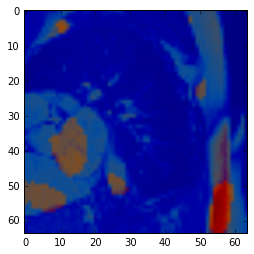

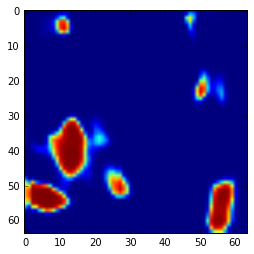

-----------  1
(30, 64, 64)


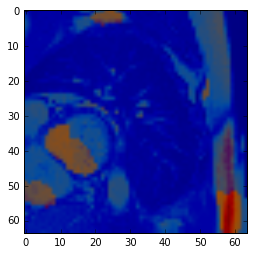

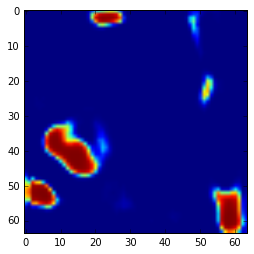

-----------  2
(30, 64, 64)


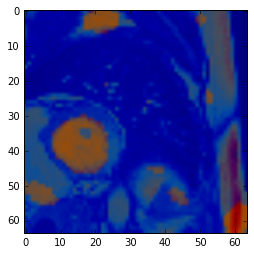

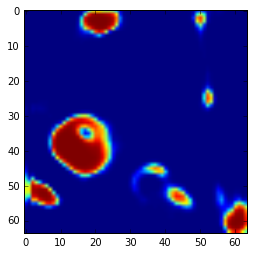

-----------  3
(30, 64, 64)


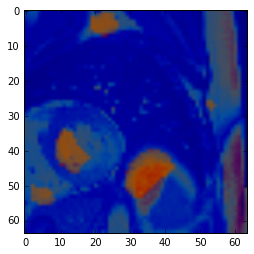

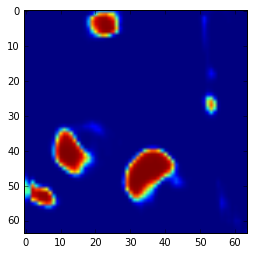

-----------  4
(30, 64, 64)


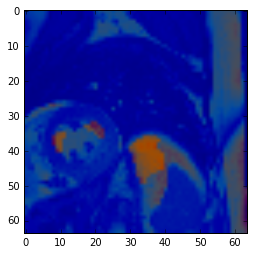

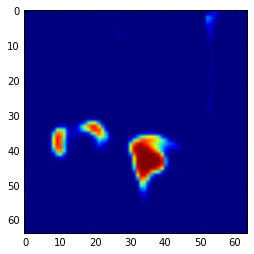

-----------  5
(30, 64, 64)


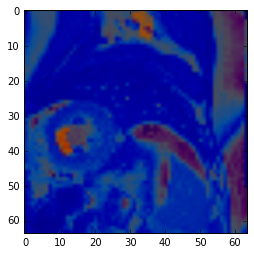

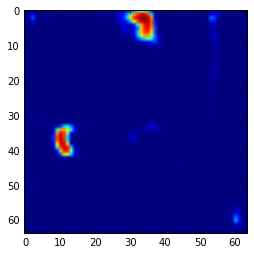

-----------  6
(30, 64, 64)


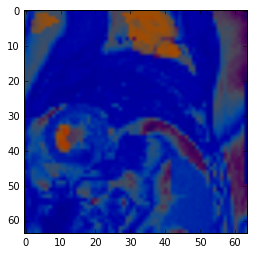

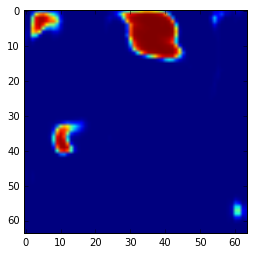

-----------  7
(30, 64, 64)


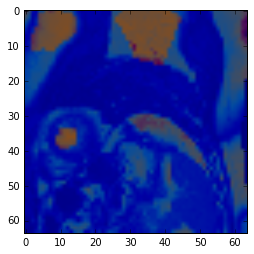

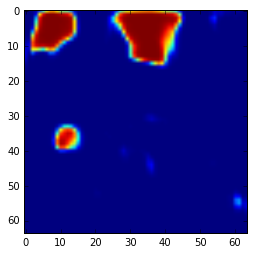

-----------  8
(30, 64, 64)


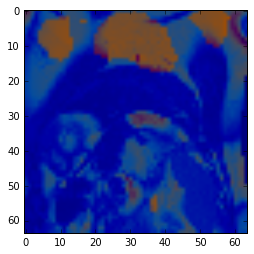

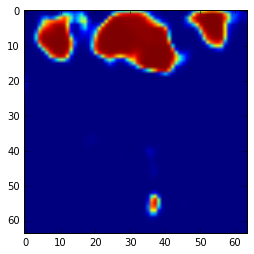

-----------  9
(30, 64, 64)


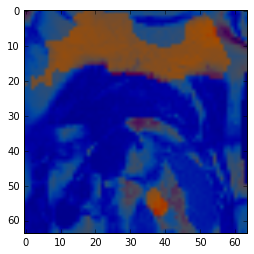

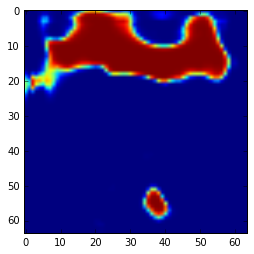

-----------  10
(30, 64, 64)


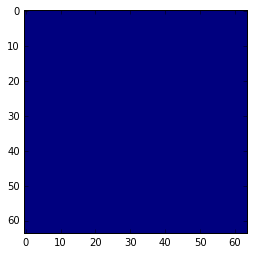

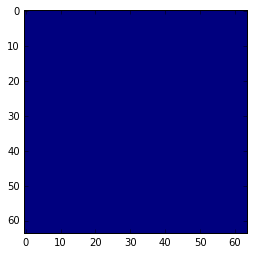

-----------  11
(30, 64, 64)


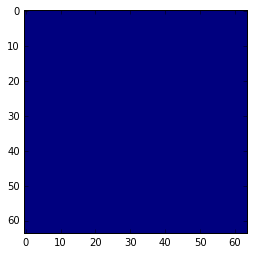

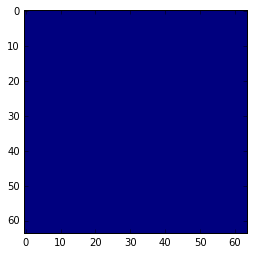

-----------  12
(30, 64, 64)


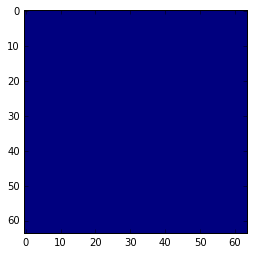

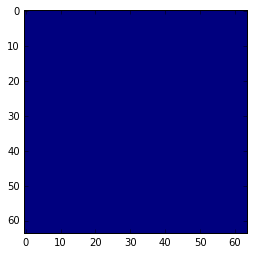

-----------  13
(30, 64, 64)


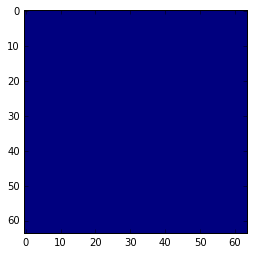

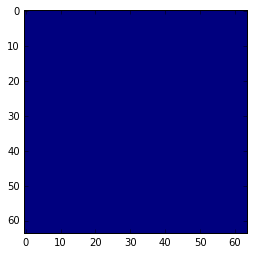

-----------  14
(30, 64, 64)


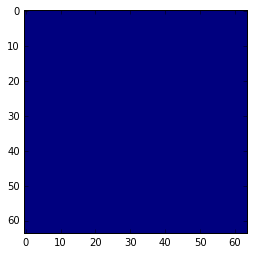

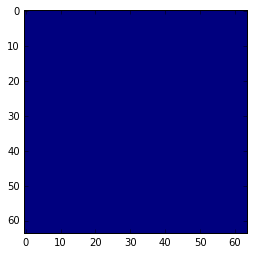

-----------  15
(30, 64, 64)


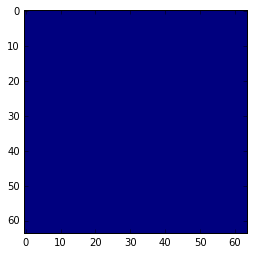

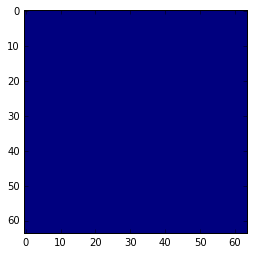

-----------  16
(30, 64, 64)


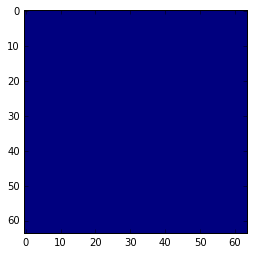

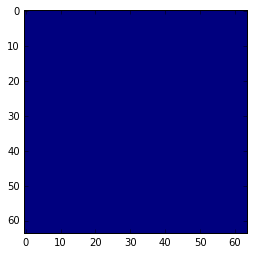

-----------  17
(30, 64, 64)


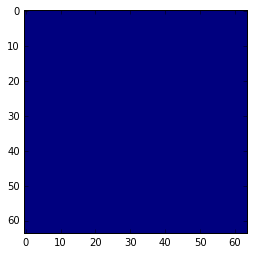

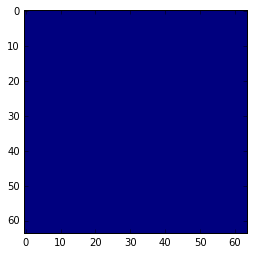

-----------  18
(30, 64, 64)


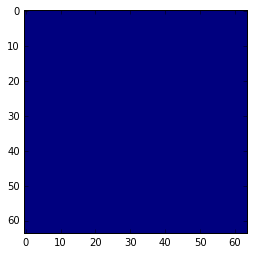

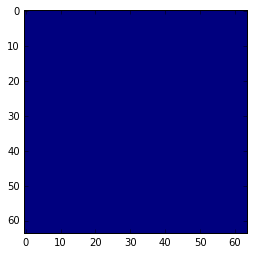

-----------  19
(30, 64, 64)


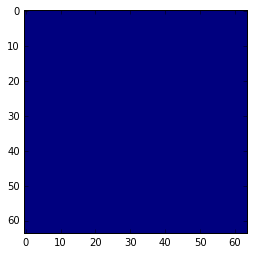

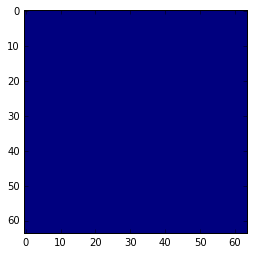

-----------  20
(30, 64, 64)


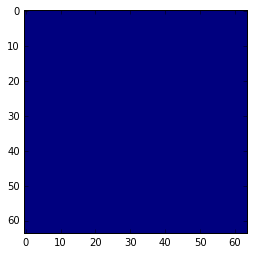

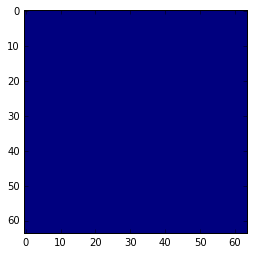

-----------  21
(30, 64, 64)


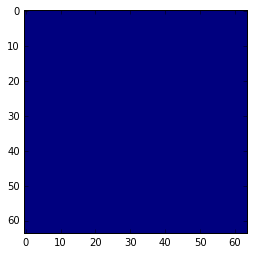

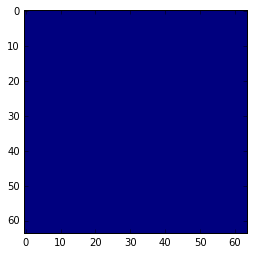

=====
1
=====
-----------  0
(30, 64, 64)


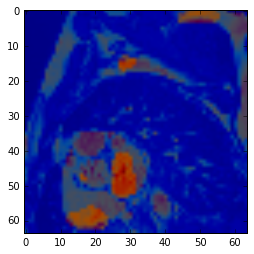

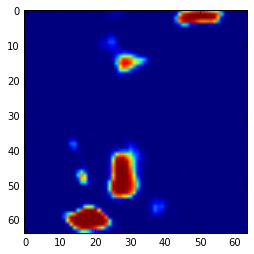

-----------  1
(30, 64, 64)


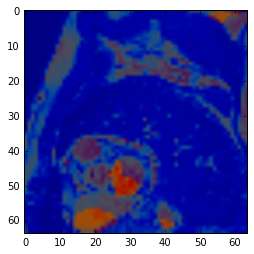

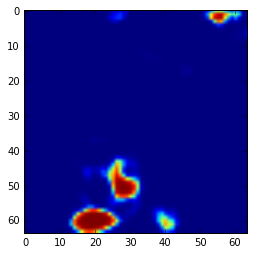

-----------  2
(30, 64, 64)


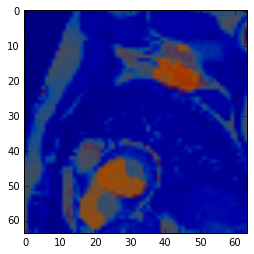

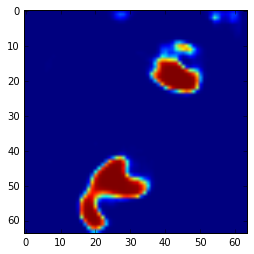

-----------  3
(30, 64, 64)


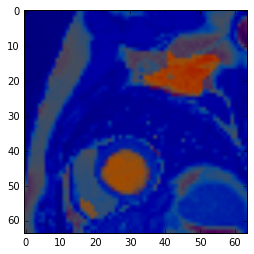

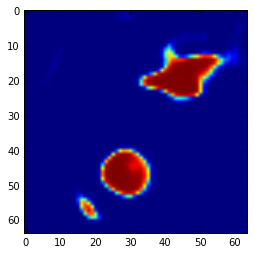

-----------  4
(30, 64, 64)


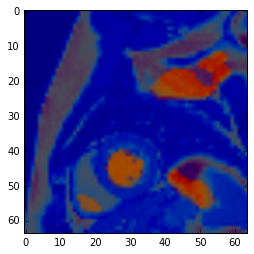

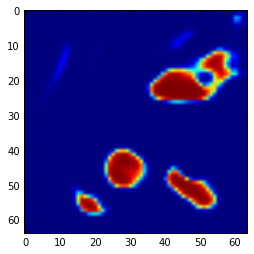

-----------  5
(30, 64, 64)


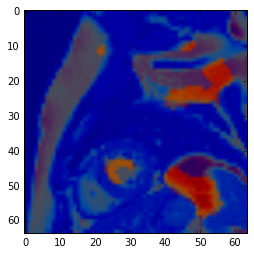

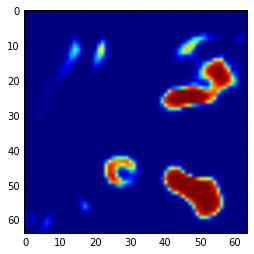

-----------  6
(30, 64, 64)


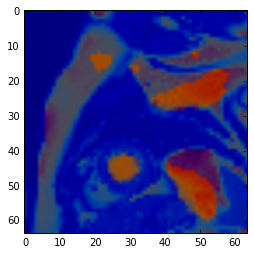

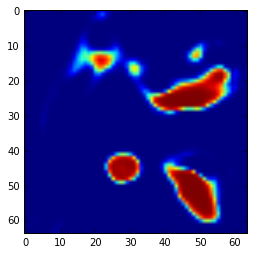

-----------  7
(30, 64, 64)


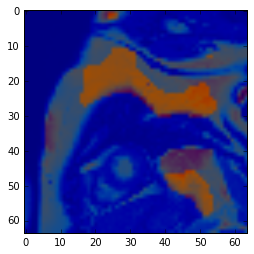

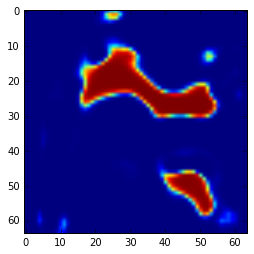

-----------  8
(30, 64, 64)


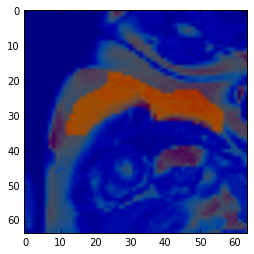

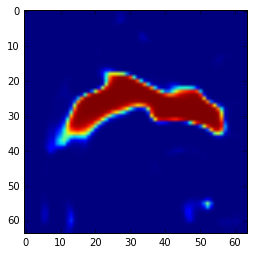

-----------  9
(30, 64, 64)


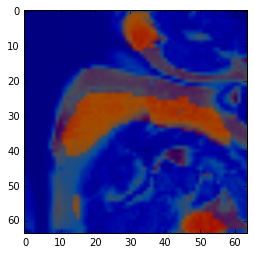

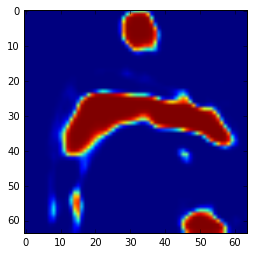

-----------  10
(30, 64, 64)


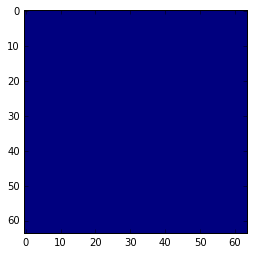

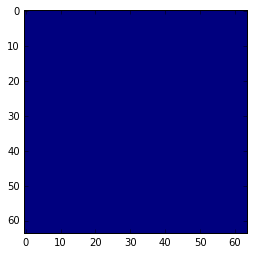

-----------  11
(30, 64, 64)


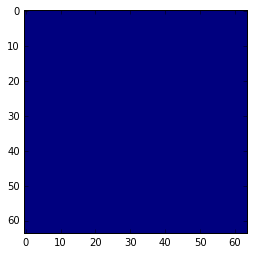

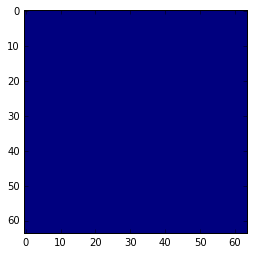

-----------  12
(30, 64, 64)


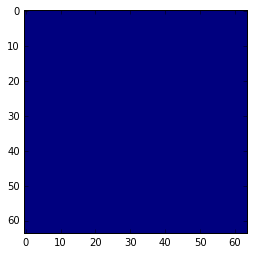

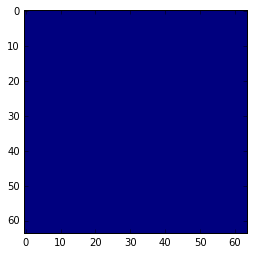

-----------  13
(30, 64, 64)


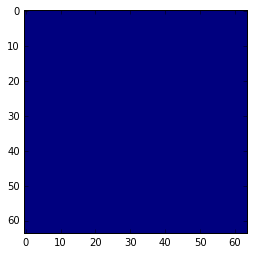

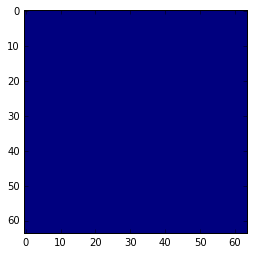

-----------  14
(30, 64, 64)


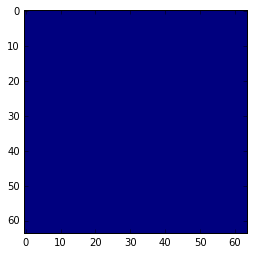

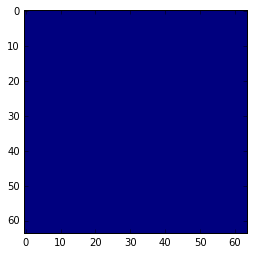

-----------  15
(30, 64, 64)


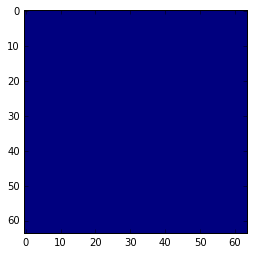

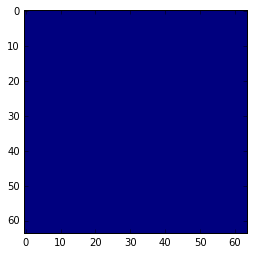

-----------  16
(30, 64, 64)


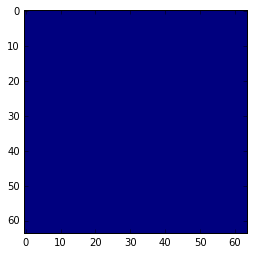

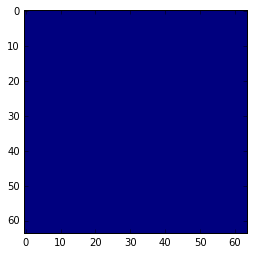

-----------  17
(30, 64, 64)


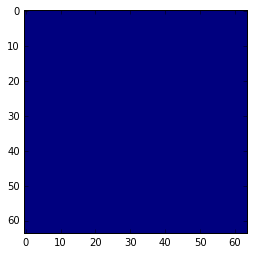

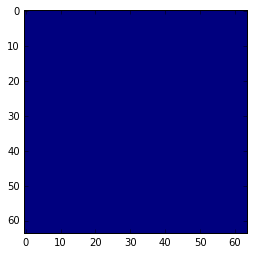

-----------  18
(30, 64, 64)


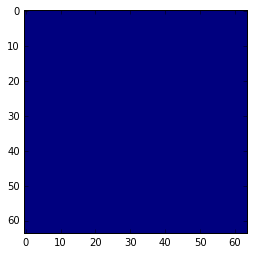

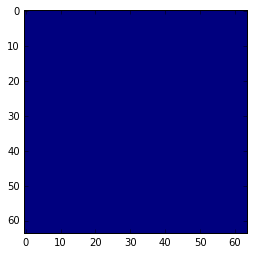

-----------  19
(30, 64, 64)


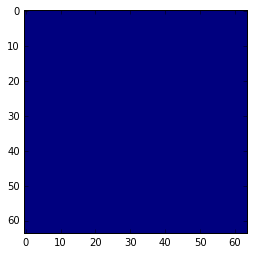

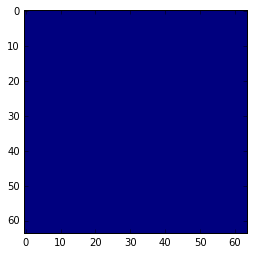

-----------  20
(30, 64, 64)


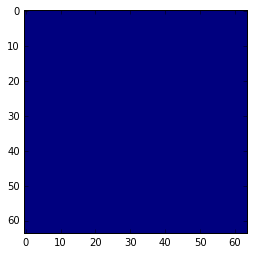

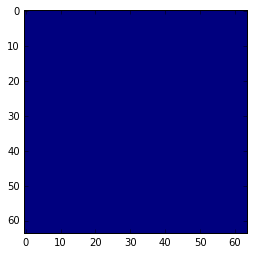

-----------  21
(30, 64, 64)


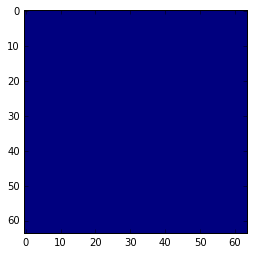

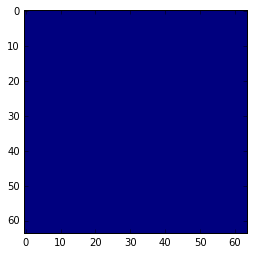

=====
2
=====
-----------  0
(30, 64, 64)


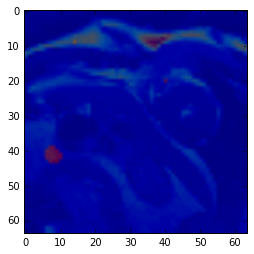

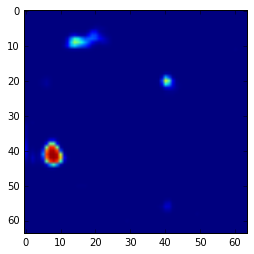

-----------  1
(30, 64, 64)


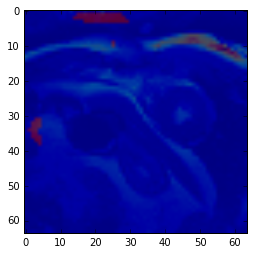

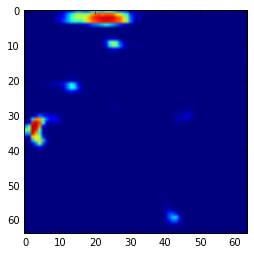

-----------  2
(30, 64, 64)


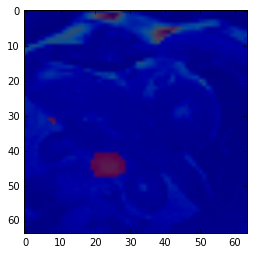

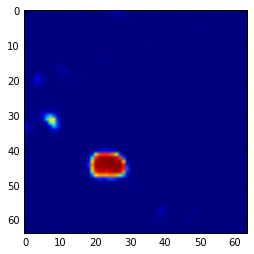

-----------  3
(30, 64, 64)


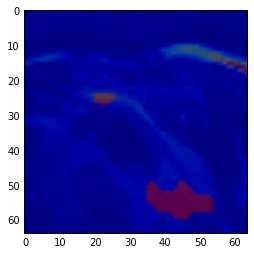

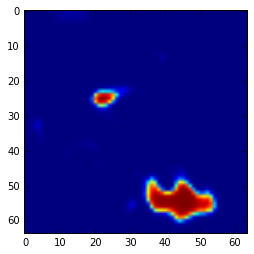

-----------  4
(30, 64, 64)


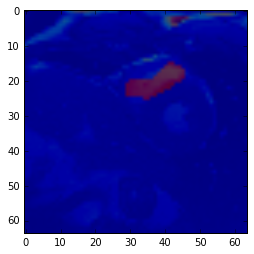

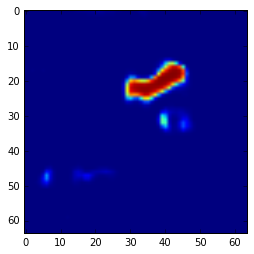

-----------  5
(30, 64, 64)


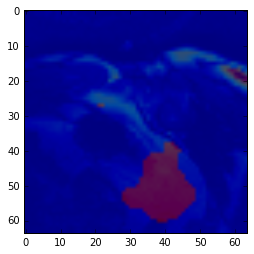

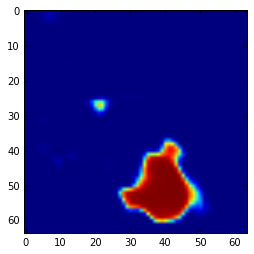

-----------  6
(30, 64, 64)


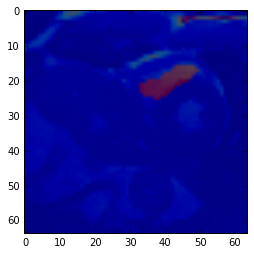

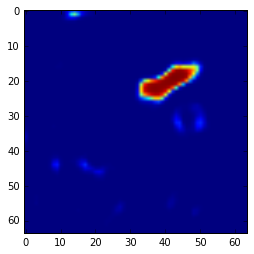

-----------  7
(30, 64, 64)


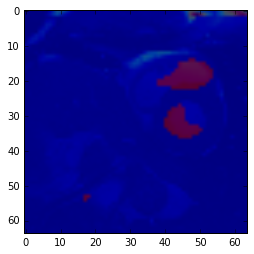

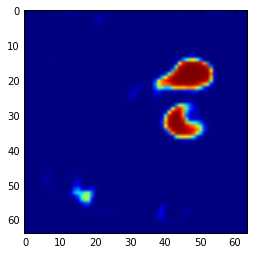

-----------  8
(30, 64, 64)


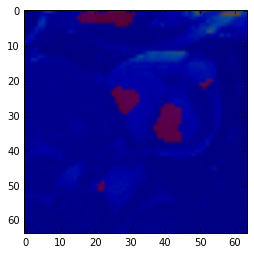

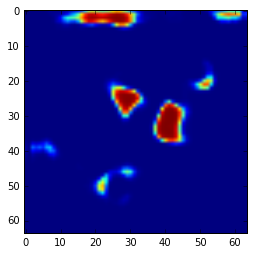

-----------  9
(30, 64, 64)


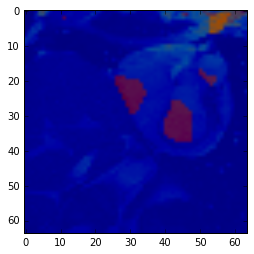

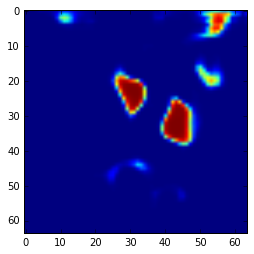

-----------  10
(30, 64, 64)


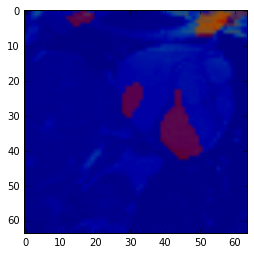

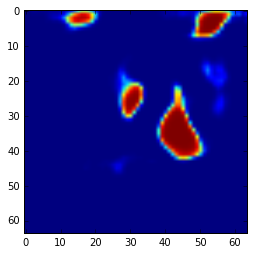

-----------  11
(30, 64, 64)


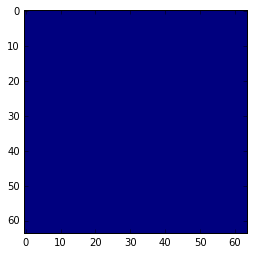

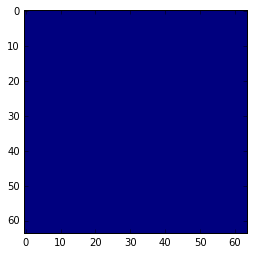

-----------  12
(30, 64, 64)


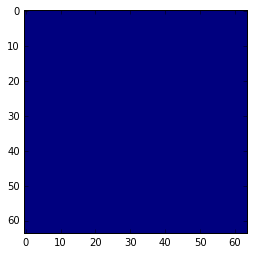

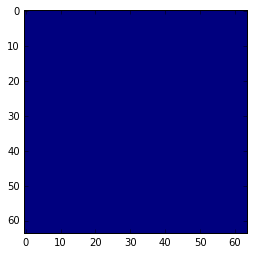

-----------  13
(30, 64, 64)


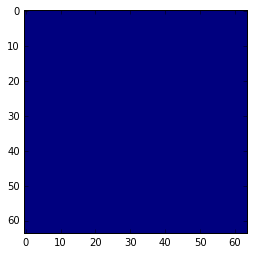

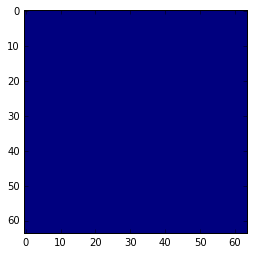

-----------  14
(30, 64, 64)


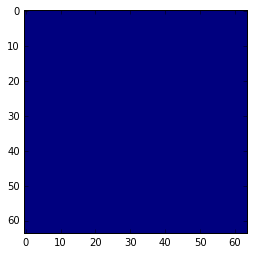

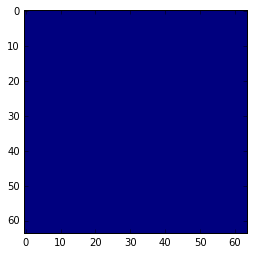

-----------  15
(30, 64, 64)


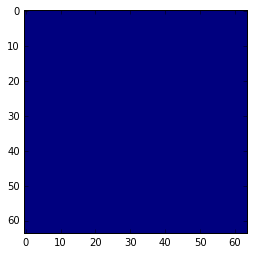

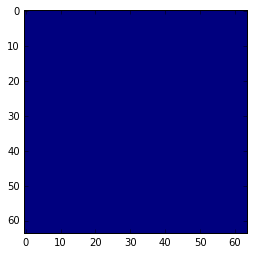

-----------  16
(30, 64, 64)


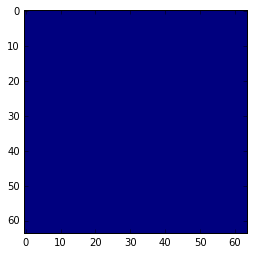

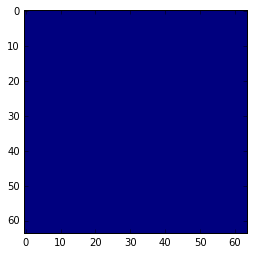

-----------  17
(30, 64, 64)


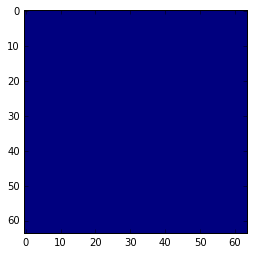

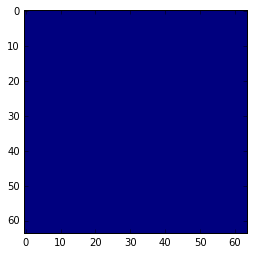

-----------  18
(30, 64, 64)


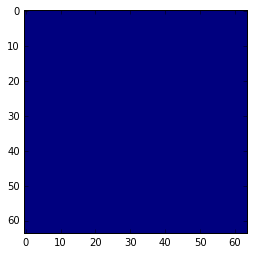

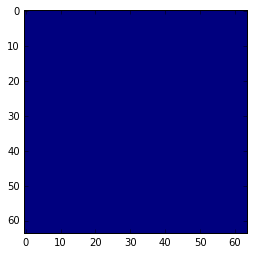

-----------  19
(30, 64, 64)


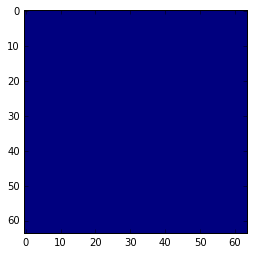

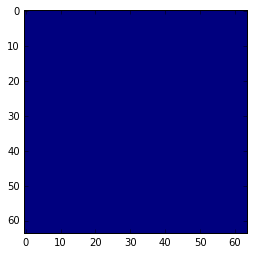

-----------  20
(30, 64, 64)


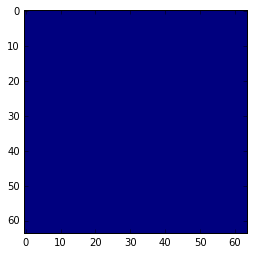

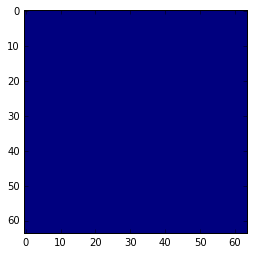

-----------  21
(30, 64, 64)


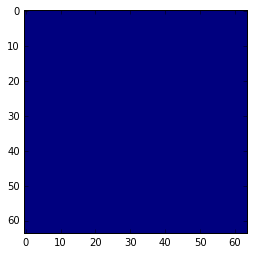

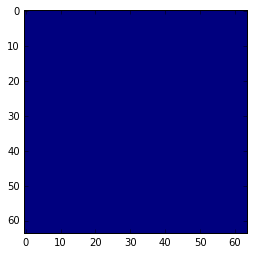

=====
3
=====
-----------  0
(30, 64, 64)


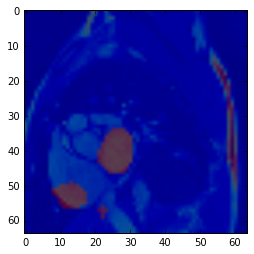

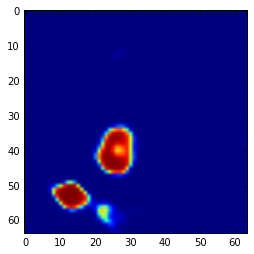

-----------  1
(30, 64, 64)


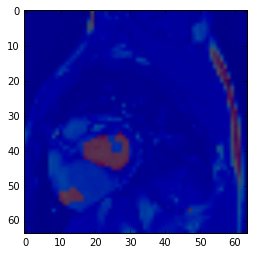

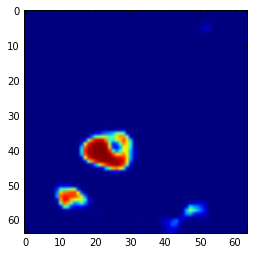

-----------  2
(30, 64, 64)


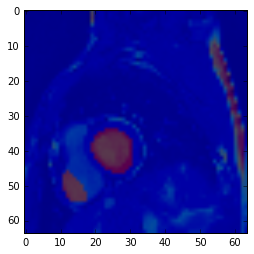

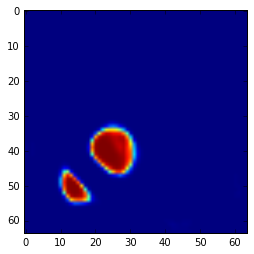

-----------  3
(30, 64, 64)


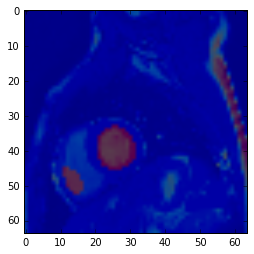

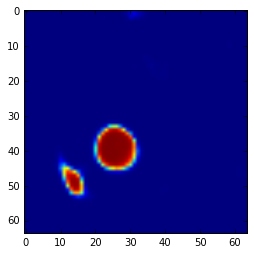

-----------  4
(30, 64, 64)


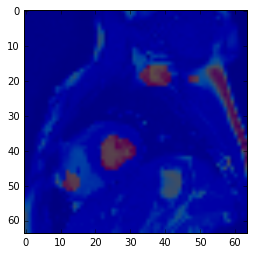

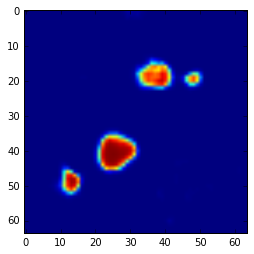

-----------  5
(30, 64, 64)


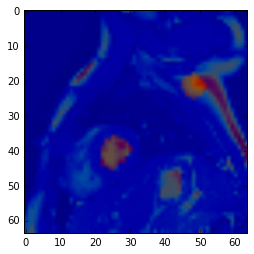

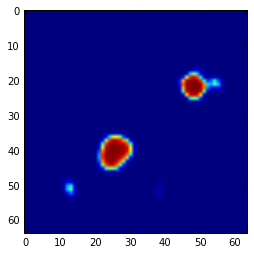

-----------  6
(30, 64, 64)


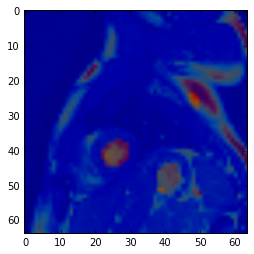

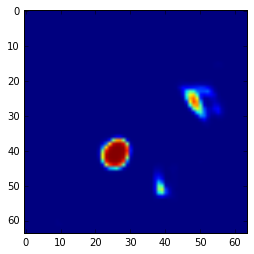

-----------  7
(30, 64, 64)


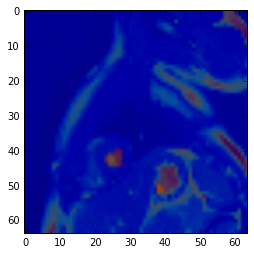

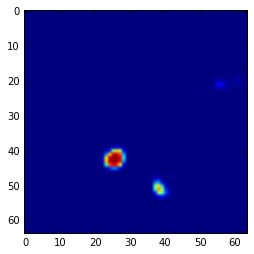

-----------  8
(30, 64, 64)


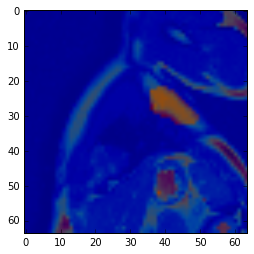

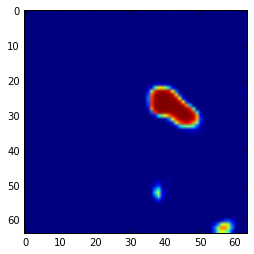

-----------  9
(30, 64, 64)


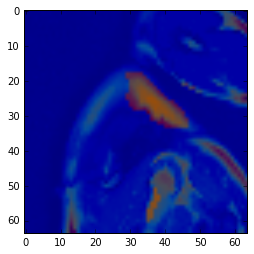

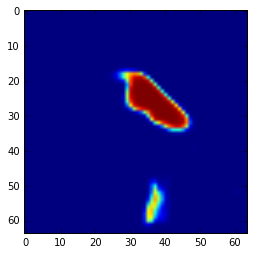

-----------  10
(30, 64, 64)


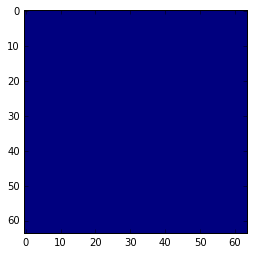

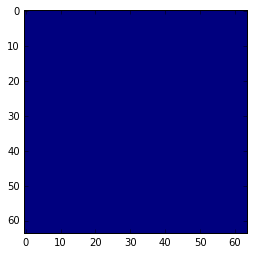

-----------  11
(30, 64, 64)


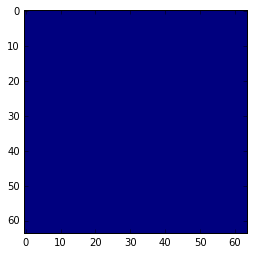

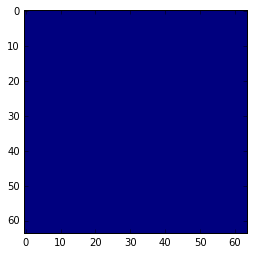

-----------  12
(30, 64, 64)


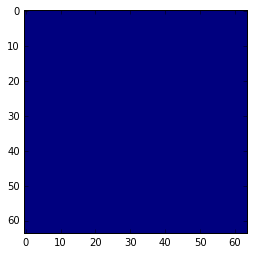

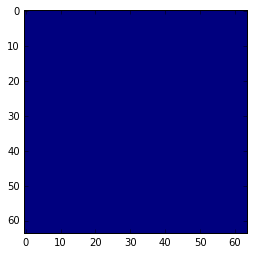

-----------  13
(30, 64, 64)


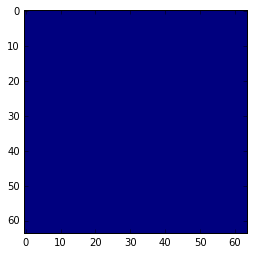

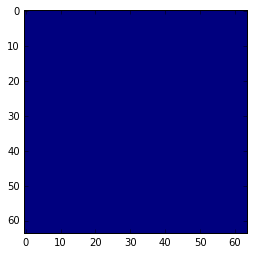

-----------  14
(30, 64, 64)


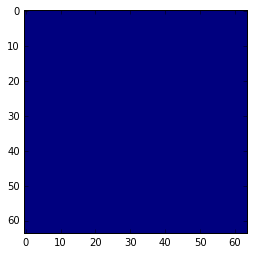

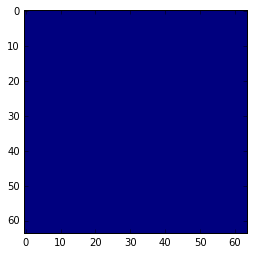

-----------  15
(30, 64, 64)


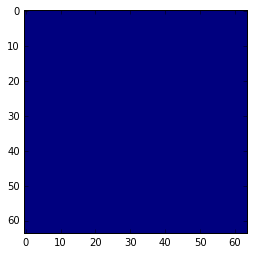

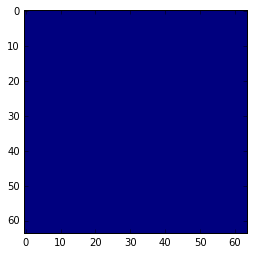

-----------  16
(30, 64, 64)


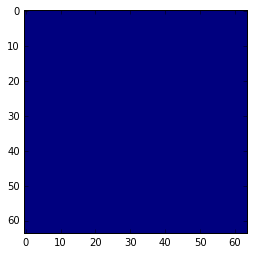

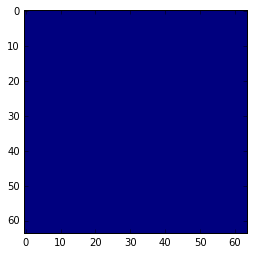

-----------  17
(30, 64, 64)


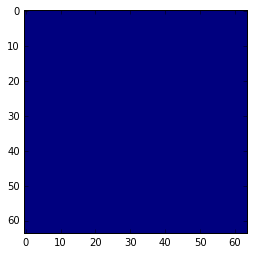

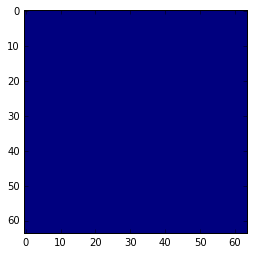

-----------  18
(30, 64, 64)


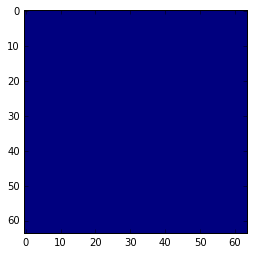

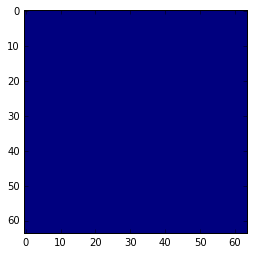

-----------  19
(30, 64, 64)


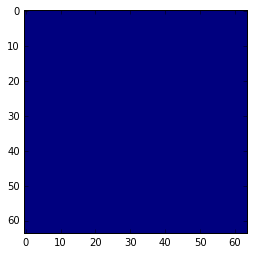

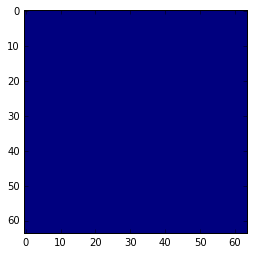

-----------  20
(30, 64, 64)


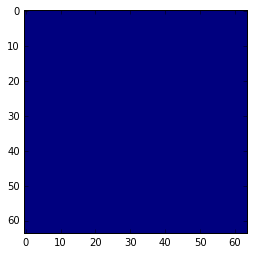

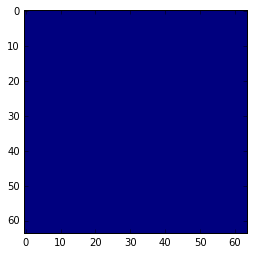

-----------  21
(30, 64, 64)


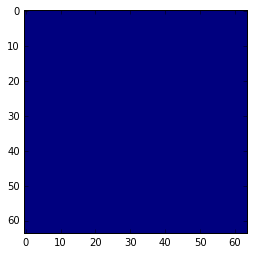

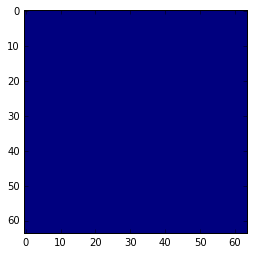

=====
4
=====
-----------  0
(30, 64, 64)


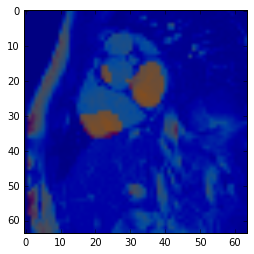

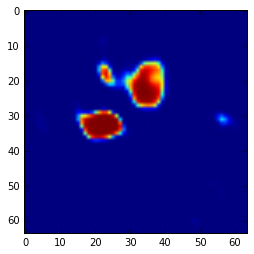

-----------  1
(30, 64, 64)


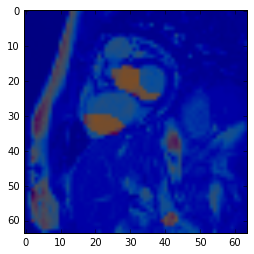

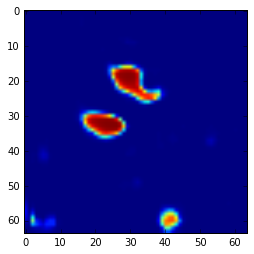

-----------  2
(30, 64, 64)


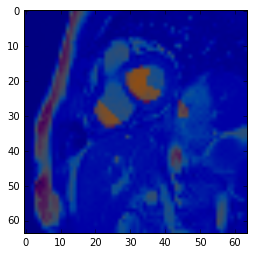

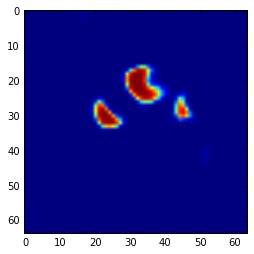

-----------  3
(30, 64, 64)


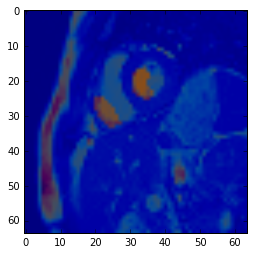

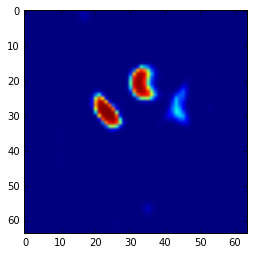

-----------  4
(30, 64, 64)


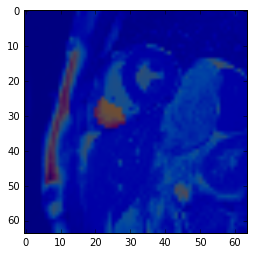

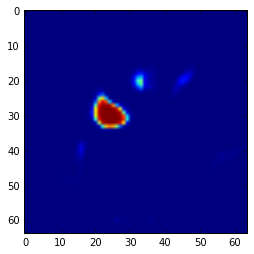

-----------  5
(30, 64, 64)


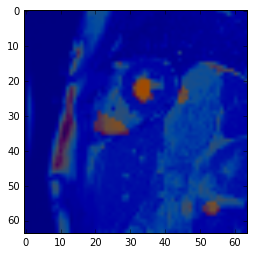

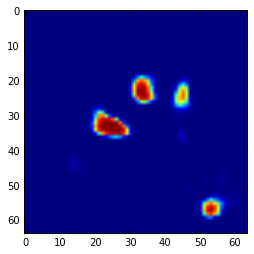

-----------  6
(30, 64, 64)


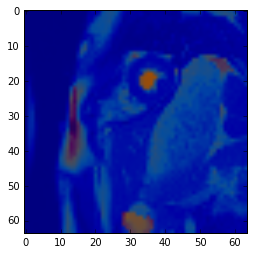

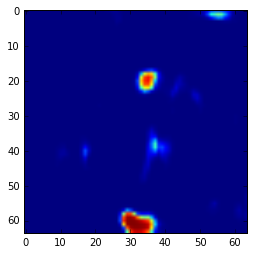

-----------  7
(30, 64, 64)


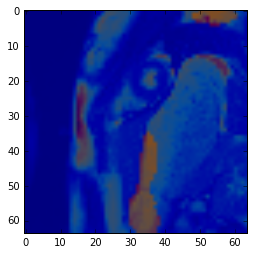

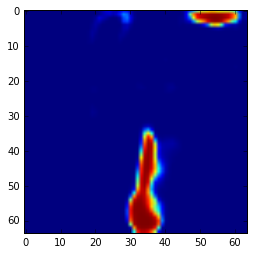

-----------  8
(30, 64, 64)


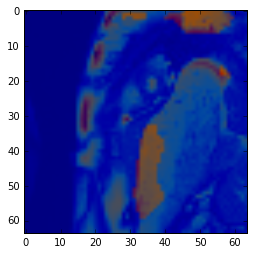

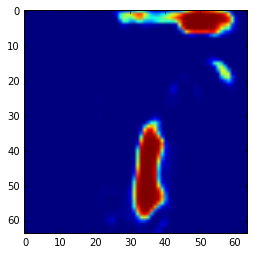

-----------  9
(30, 64, 64)


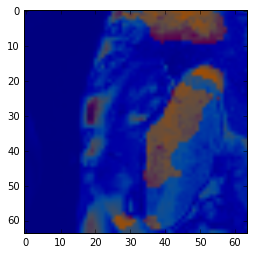

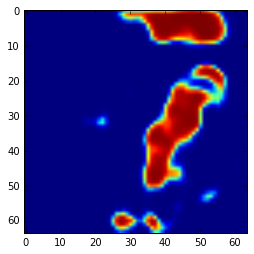

-----------  10
(30, 64, 64)


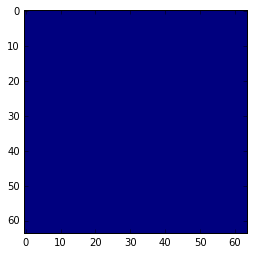

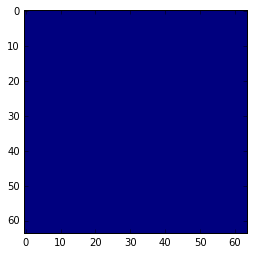

-----------  11
(30, 64, 64)


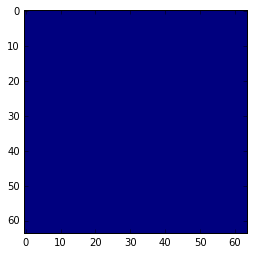

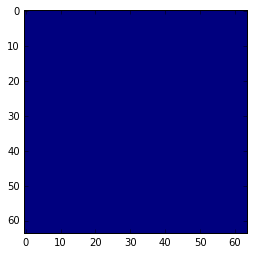

-----------  12
(30, 64, 64)


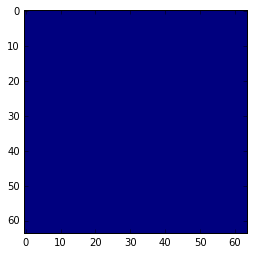

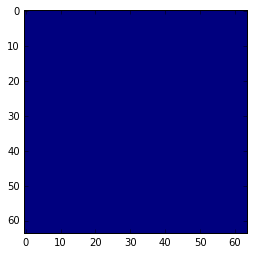

-----------  13
(30, 64, 64)


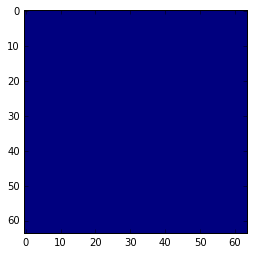

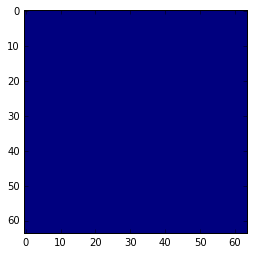

-----------  14
(30, 64, 64)


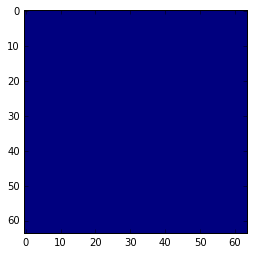

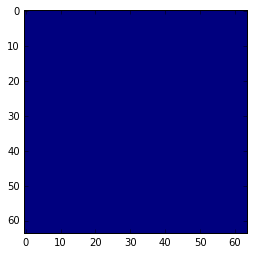

-----------  15
(30, 64, 64)


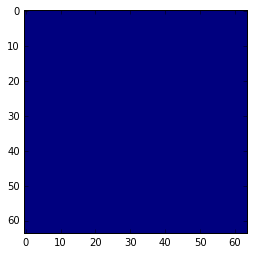

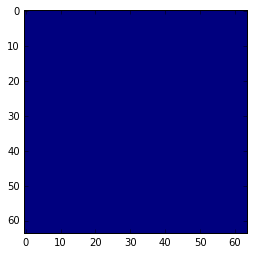

-----------  16
(30, 64, 64)


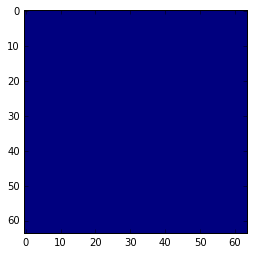

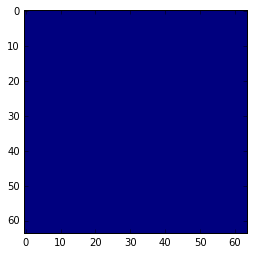

-----------  17
(30, 64, 64)


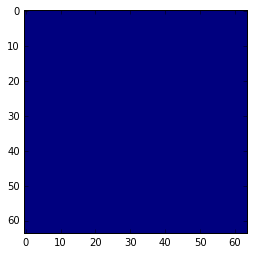

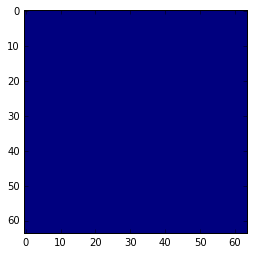

-----------  18
(30, 64, 64)


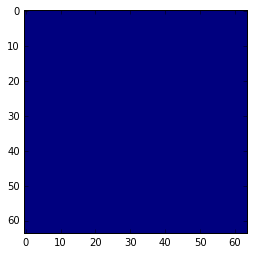

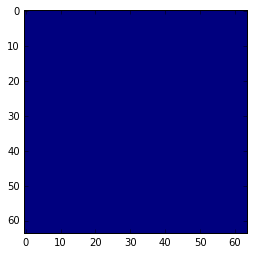

-----------  19
(30, 64, 64)


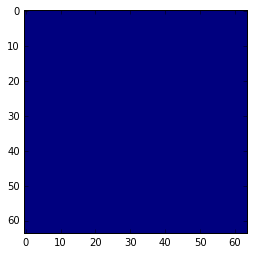

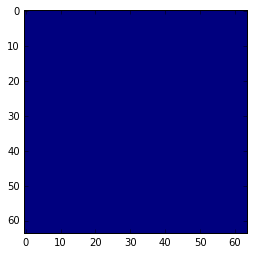

-----------  20
(30, 64, 64)


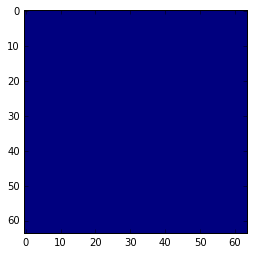

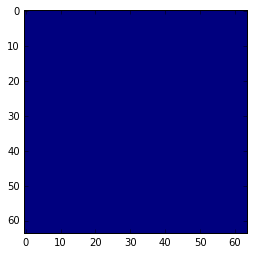

-----------  21
(30, 64, 64)


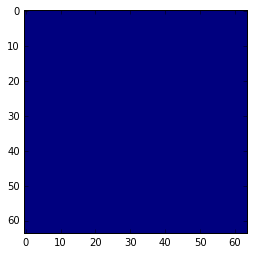

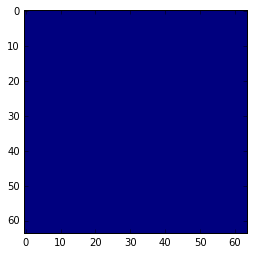

=====
5
=====
-----------  0
(30, 64, 64)


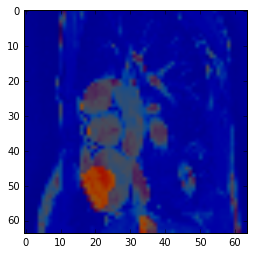

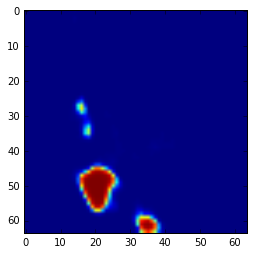

-----------  1
(30, 64, 64)


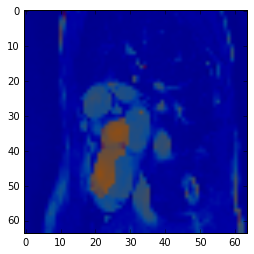

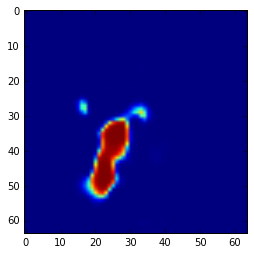

-----------  2
(30, 64, 64)


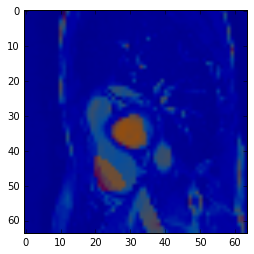

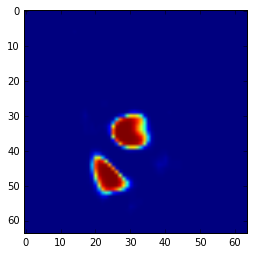

-----------  3
(30, 64, 64)


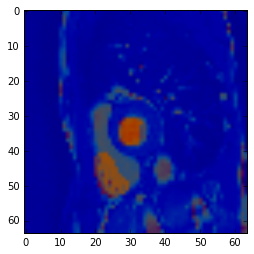

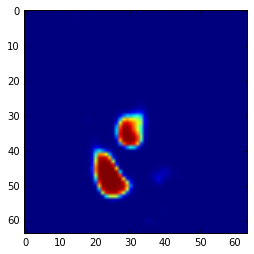

-----------  4
(30, 64, 64)


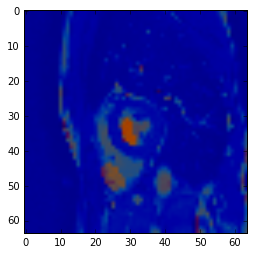

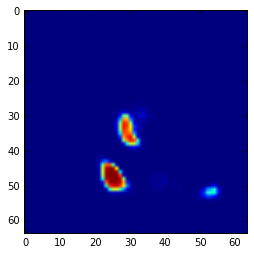

-----------  5
(30, 64, 64)


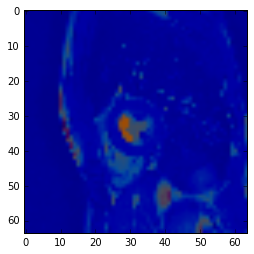

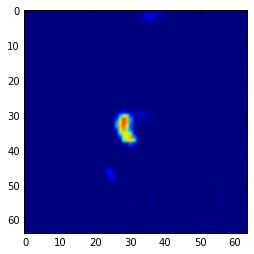

-----------  6
(30, 64, 64)


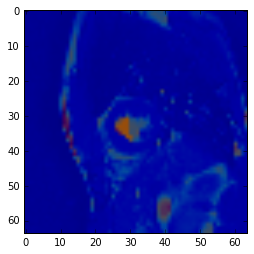

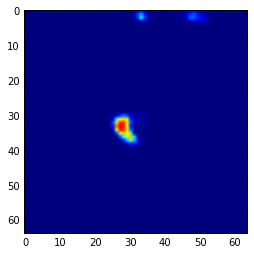

-----------  7
(30, 64, 64)


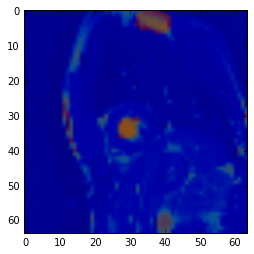

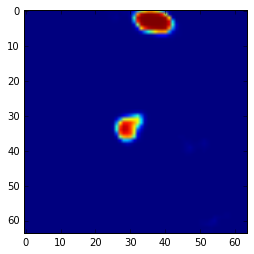

-----------  8
(30, 64, 64)


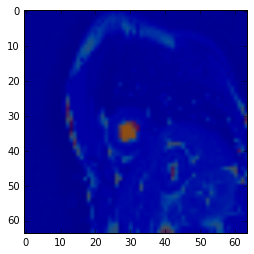

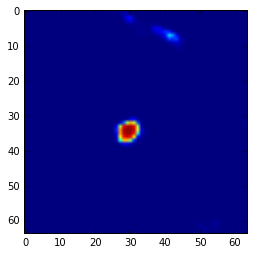

-----------  9
(30, 64, 64)


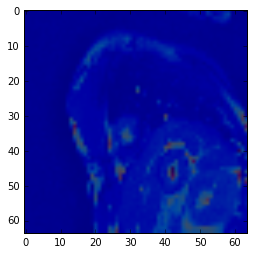

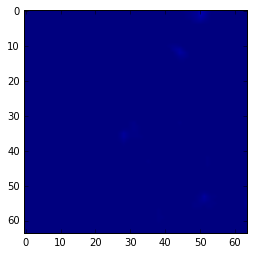

-----------  10
(30, 64, 64)


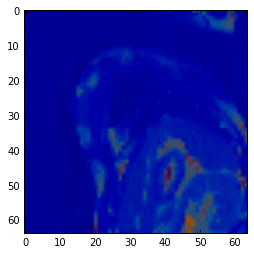

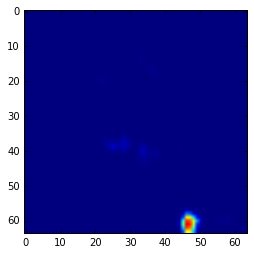

-----------  11
(30, 64, 64)


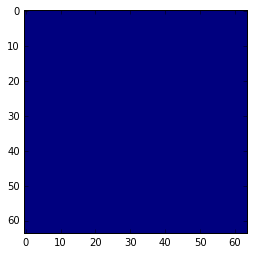

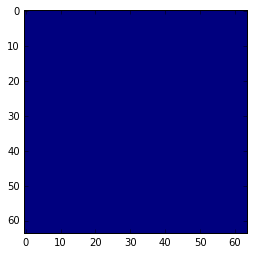

-----------  12
(30, 64, 64)


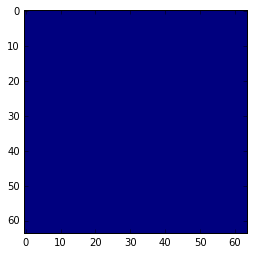

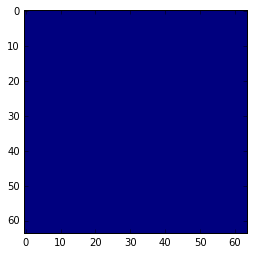

-----------  13
(30, 64, 64)


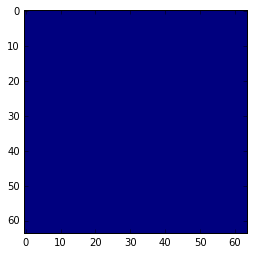

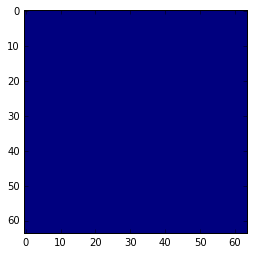

-----------  14
(30, 64, 64)


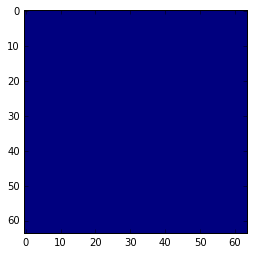

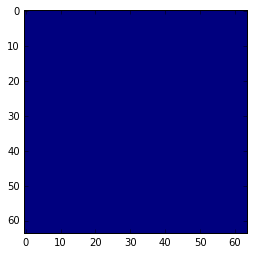

-----------  15
(30, 64, 64)


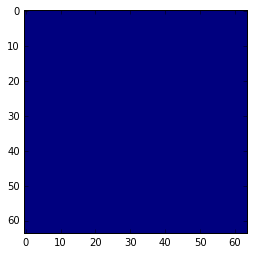

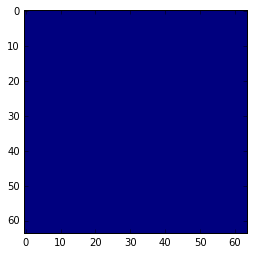

-----------  16
(30, 64, 64)


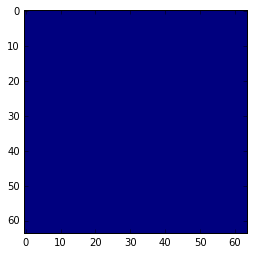

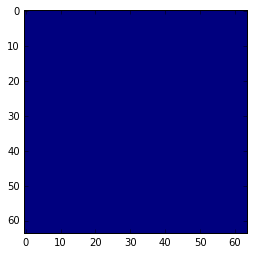

-----------  17
(30, 64, 64)


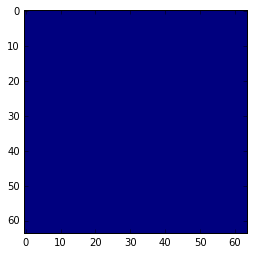

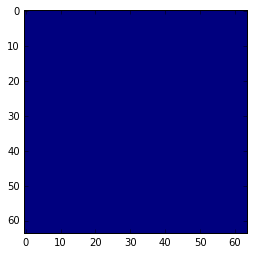

-----------  18
(30, 64, 64)


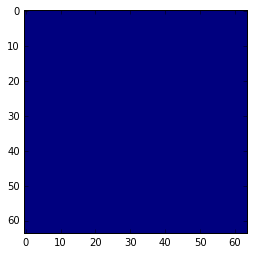

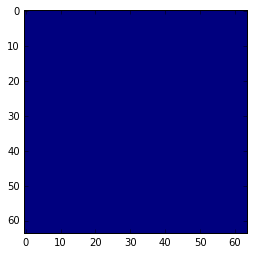

-----------  19
(30, 64, 64)


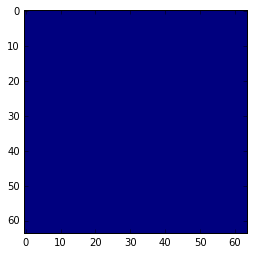

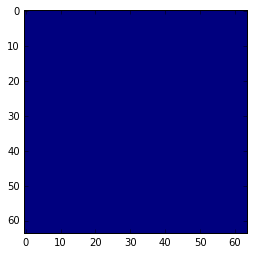

-----------  20
(30, 64, 64)


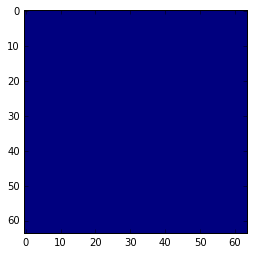

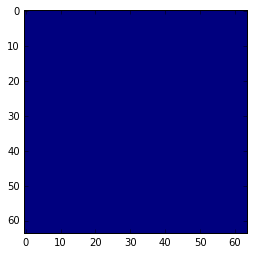

-----------  21
(30, 64, 64)


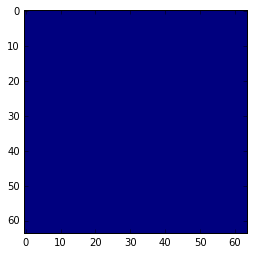

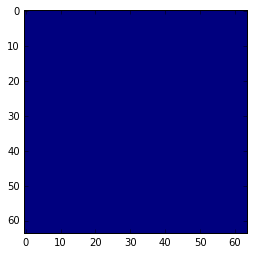

=====
6
=====
-----------  0
(30, 64, 64)


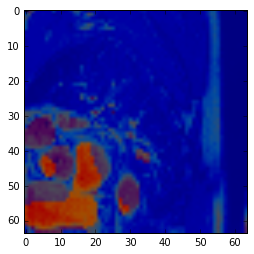

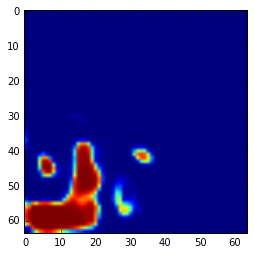

-----------  1
(30, 64, 64)


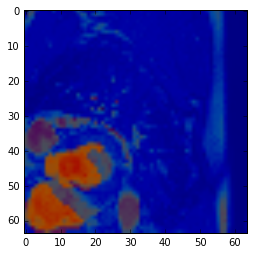

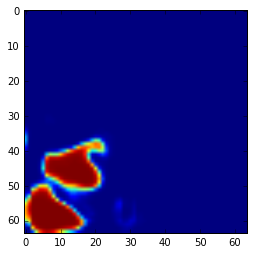

-----------  2
(30, 64, 64)


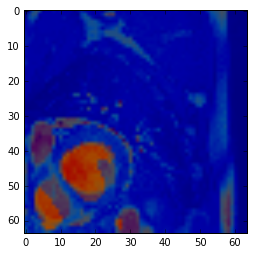

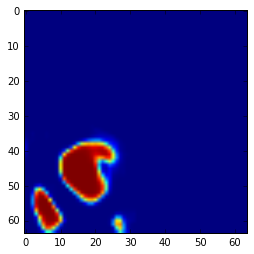

-----------  3
(30, 64, 64)


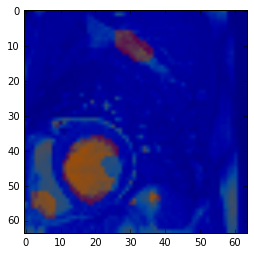

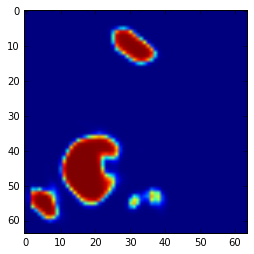

-----------  4
(30, 64, 64)


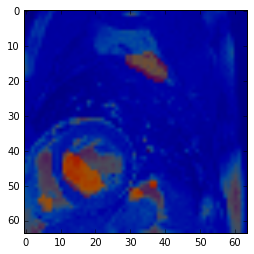

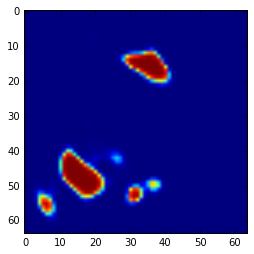

-----------  5
(30, 64, 64)


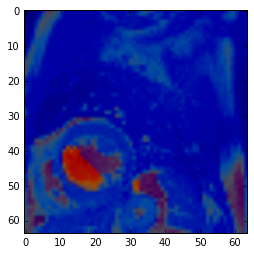

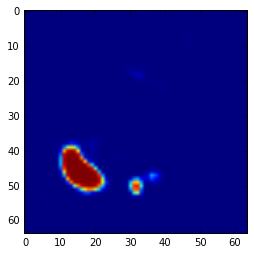

-----------  6
(30, 64, 64)


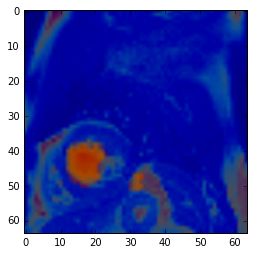

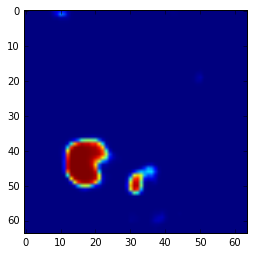

-----------  7
(30, 64, 64)


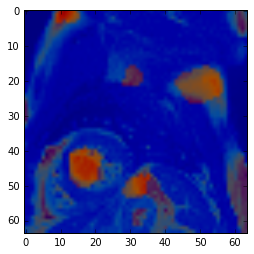

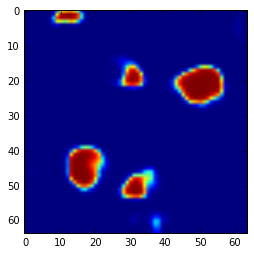

-----------  8
(30, 64, 64)


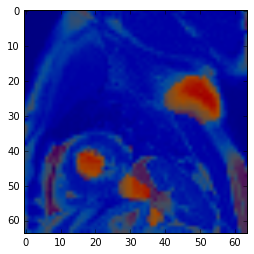

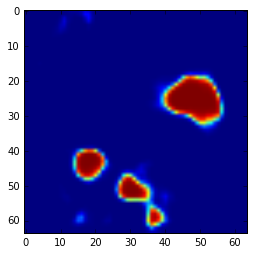

-----------  9
(30, 64, 64)


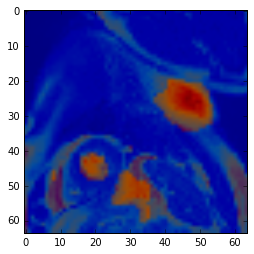

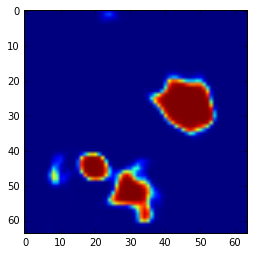

-----------  10
(30, 64, 64)


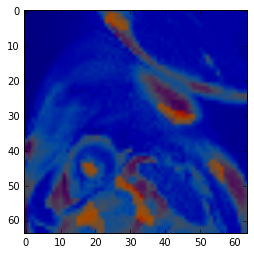

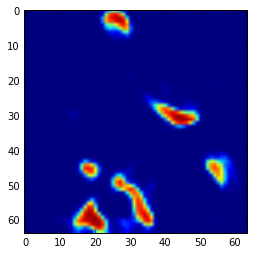

-----------  11
(30, 64, 64)


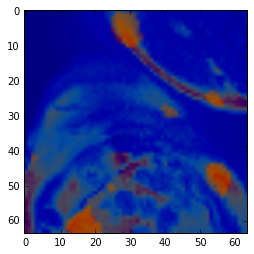

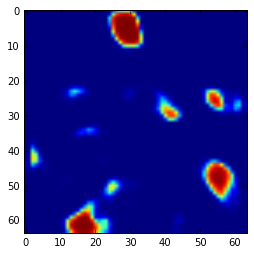

-----------  12
(30, 64, 64)


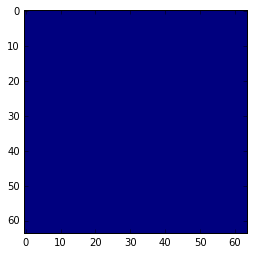

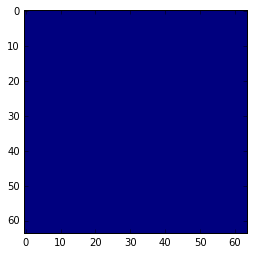

-----------  13
(30, 64, 64)


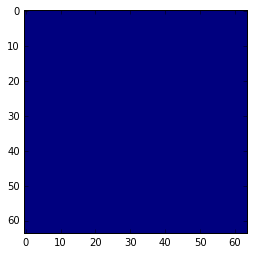

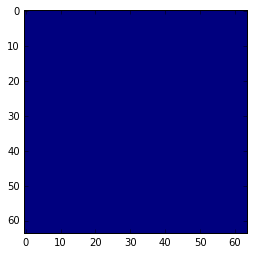

-----------  14
(30, 64, 64)


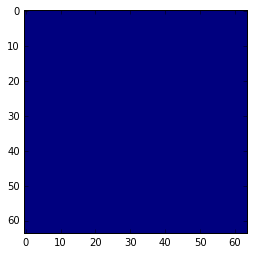

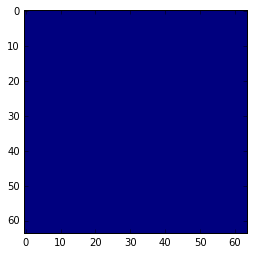

-----------  15
(30, 64, 64)


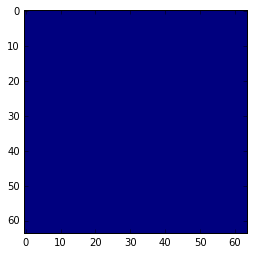

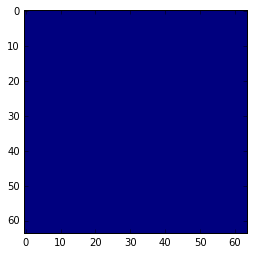

-----------  16
(30, 64, 64)


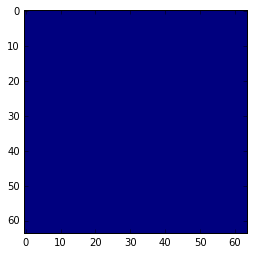

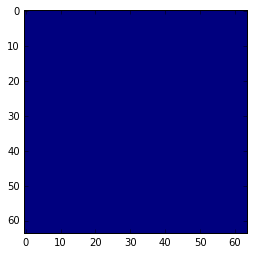

-----------  17
(30, 64, 64)


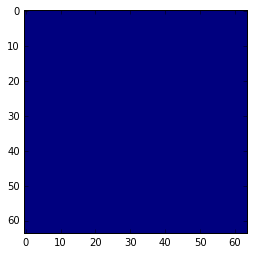

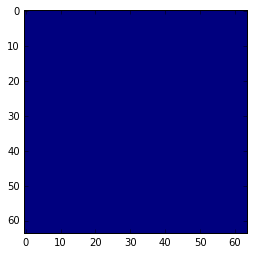

-----------  18
(30, 64, 64)


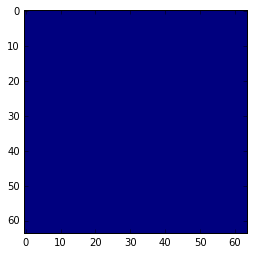

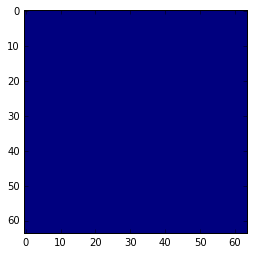

-----------  19
(30, 64, 64)


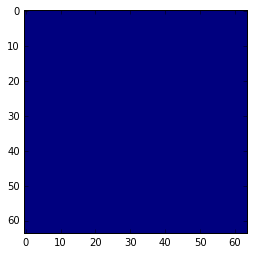

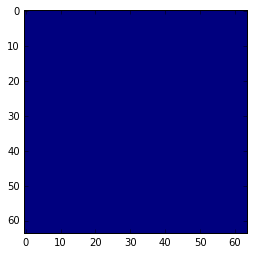

-----------  20
(30, 64, 64)


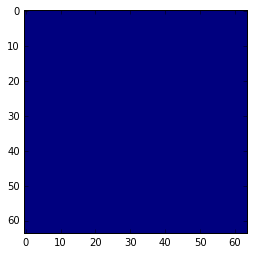

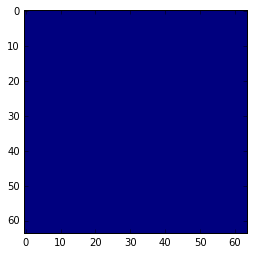

-----------  21
(30, 64, 64)


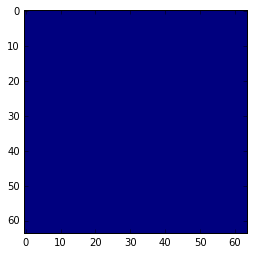

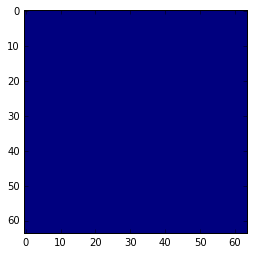

=====
7
=====
-----------  0
(30, 64, 64)


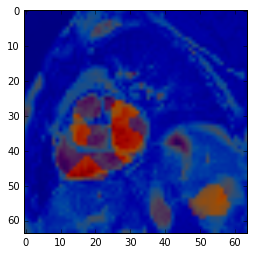

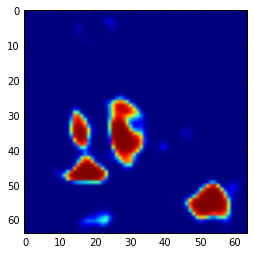

-----------  1
(30, 64, 64)


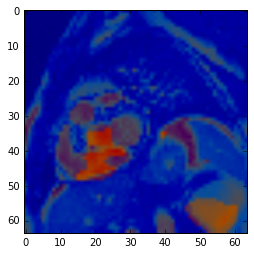

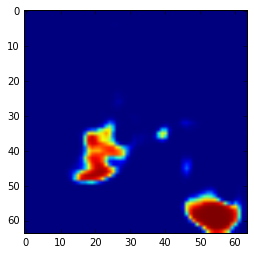

-----------  2
(30, 64, 64)


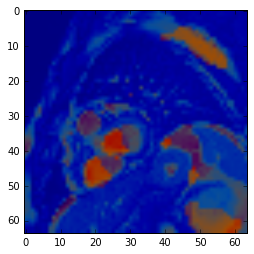

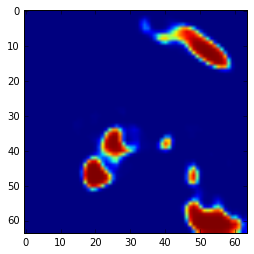

-----------  3
(30, 64, 64)


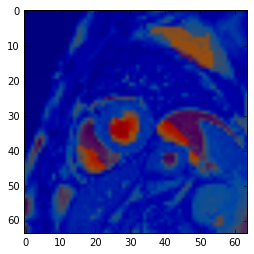

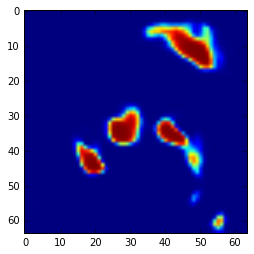

-----------  4
(30, 64, 64)


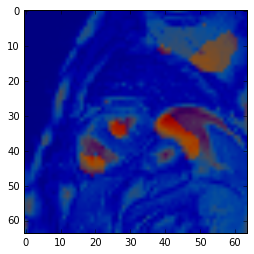

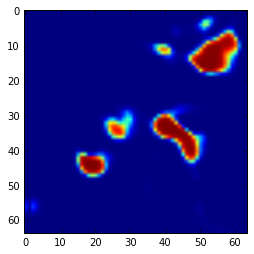

-----------  5
(30, 64, 64)


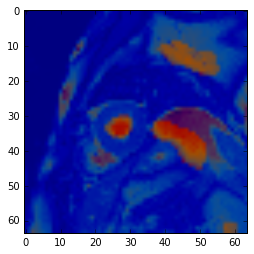

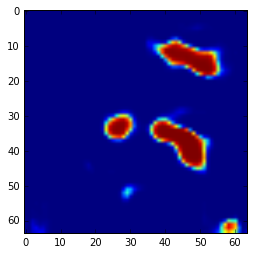

-----------  6
(30, 64, 64)


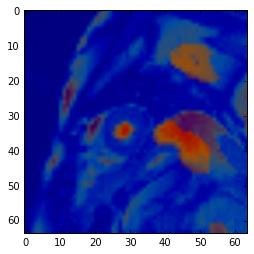

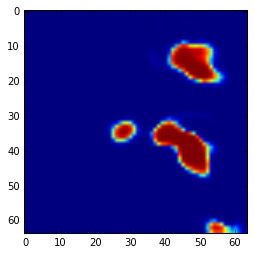

-----------  7
(30, 64, 64)


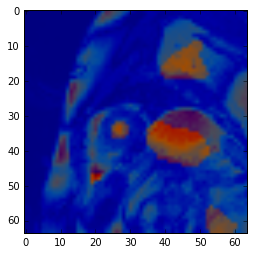

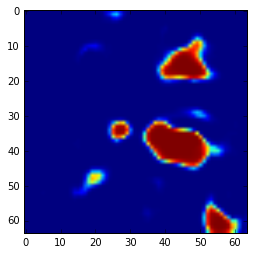

-----------  8
(30, 64, 64)


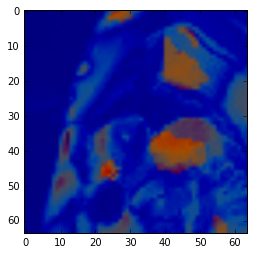

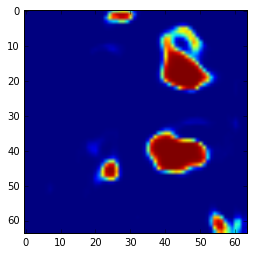

-----------  9
(30, 64, 64)


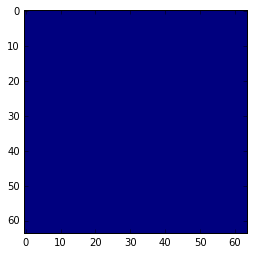

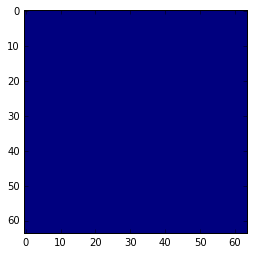

-----------  10
(30, 64, 64)


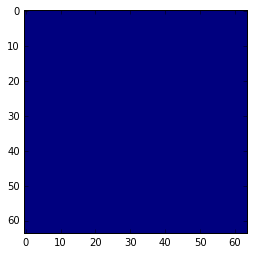

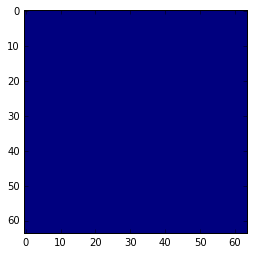

-----------  11
(30, 64, 64)


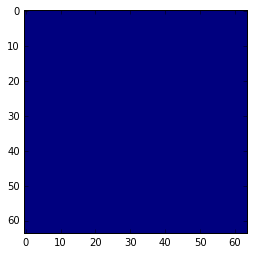

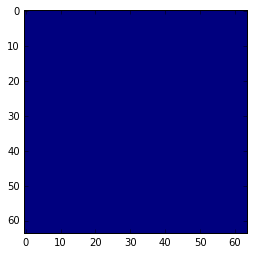

-----------  12
(30, 64, 64)


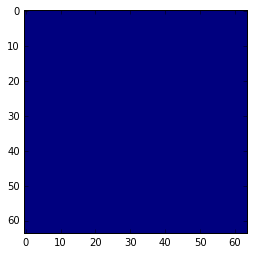

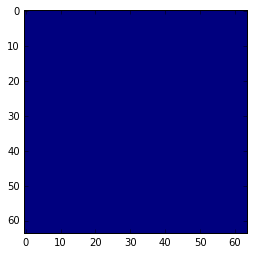

-----------  13
(30, 64, 64)


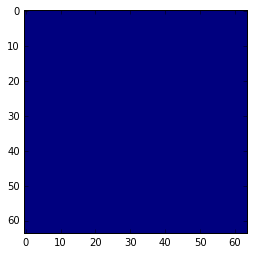

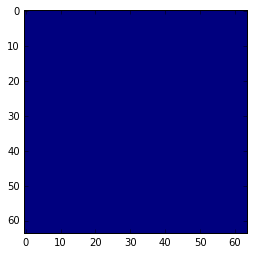

-----------  14
(30, 64, 64)


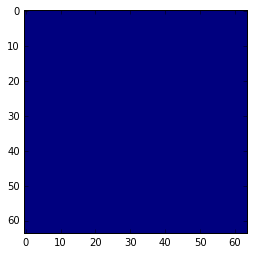

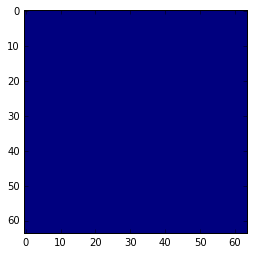

-----------  15
(30, 64, 64)


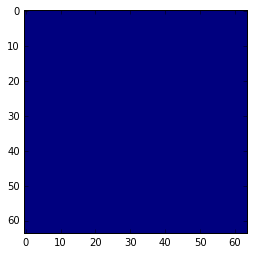

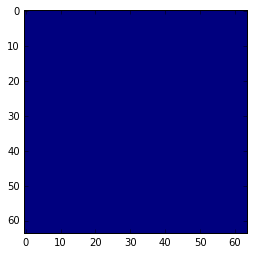

-----------  16
(30, 64, 64)


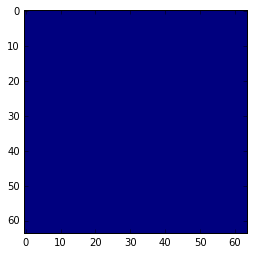

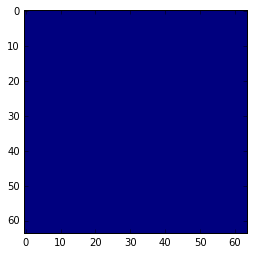

-----------  17
(30, 64, 64)


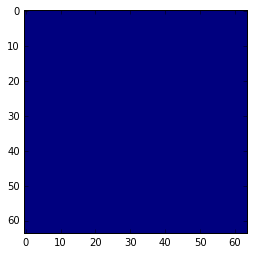

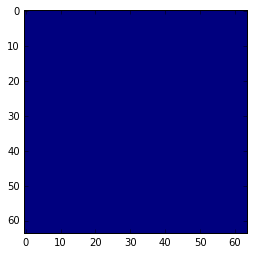

-----------  18
(30, 64, 64)


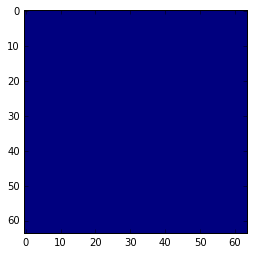

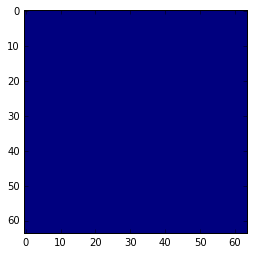

-----------  19
(30, 64, 64)


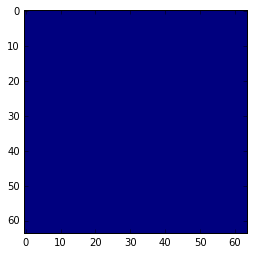

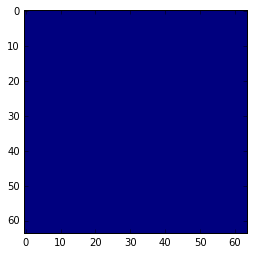

-----------  20
(30, 64, 64)


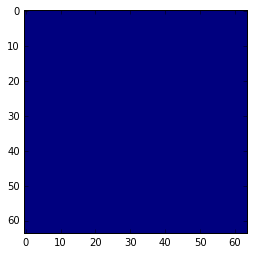

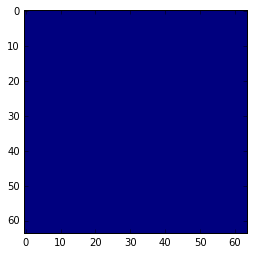

-----------  21
(30, 64, 64)


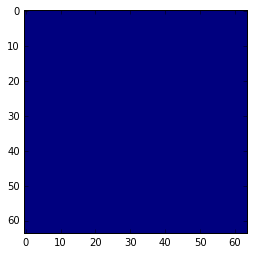

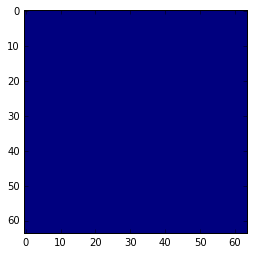

=====
8
=====
-----------  0
(30, 64, 64)


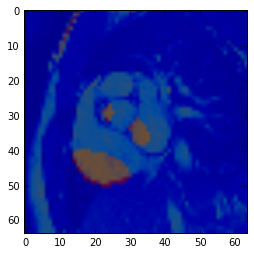

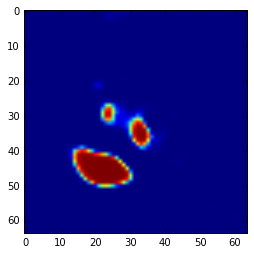

-----------  1
(30, 64, 64)


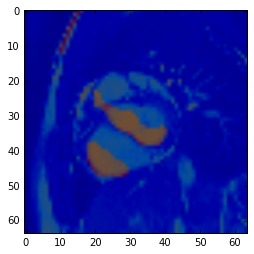

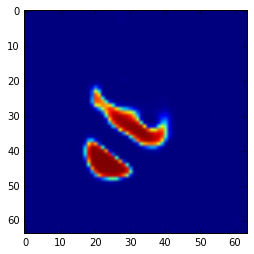

-----------  2
(30, 64, 64)


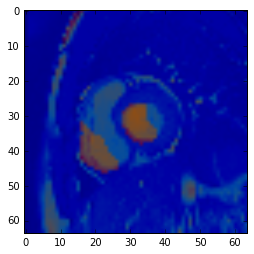

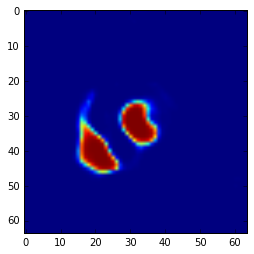

-----------  3
(30, 64, 64)


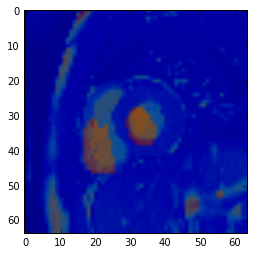

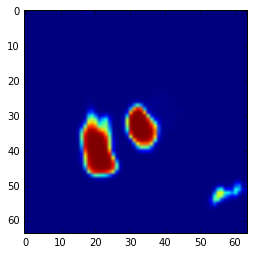

-----------  4
(30, 64, 64)


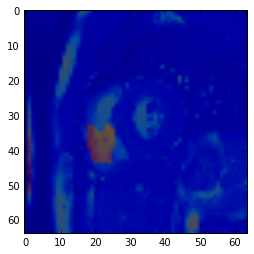

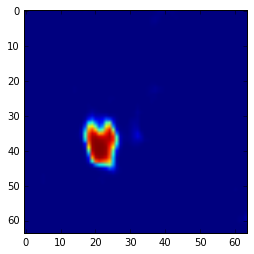

-----------  5
(30, 64, 64)


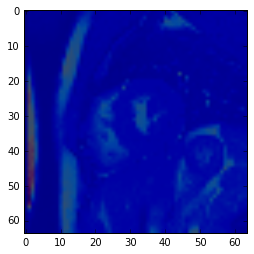

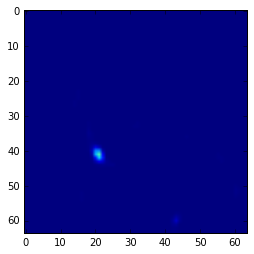

-----------  6
(30, 64, 64)


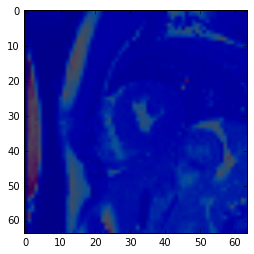

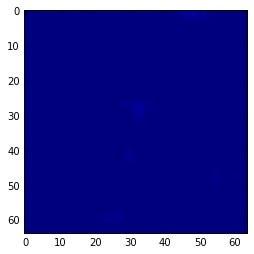

-----------  7
(30, 64, 64)


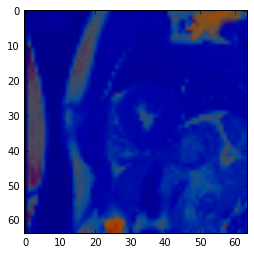

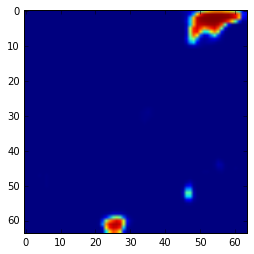

-----------  8
(30, 64, 64)


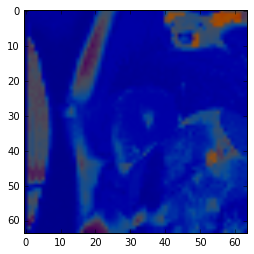

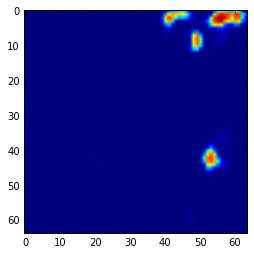

-----------  9
(30, 64, 64)


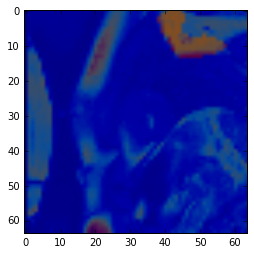

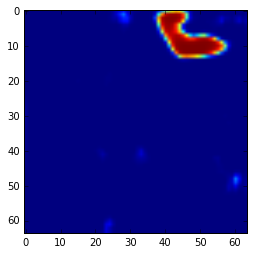

-----------  10
(30, 64, 64)


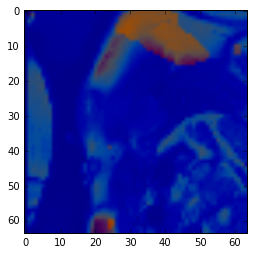

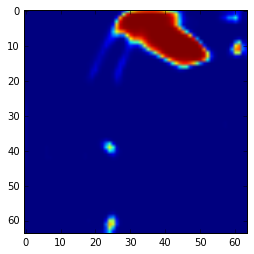

-----------  11
(30, 64, 64)


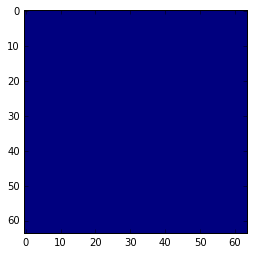

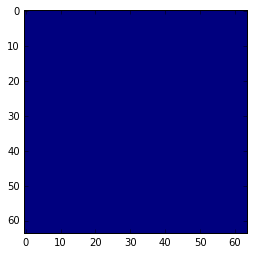

-----------  12
(30, 64, 64)


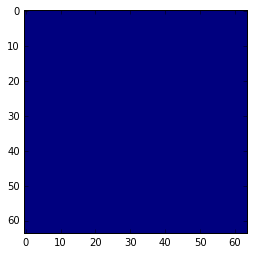

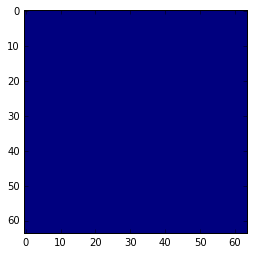

-----------  13
(30, 64, 64)


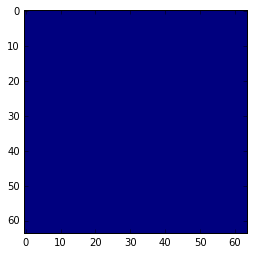

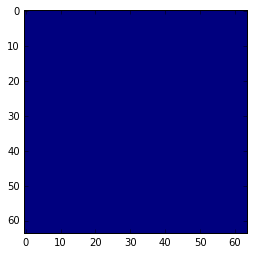

-----------  14
(30, 64, 64)


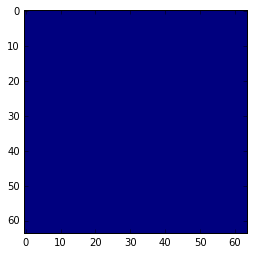

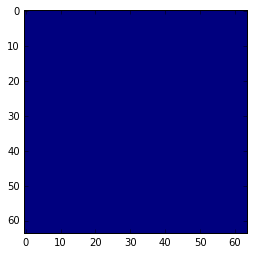

-----------  15
(30, 64, 64)


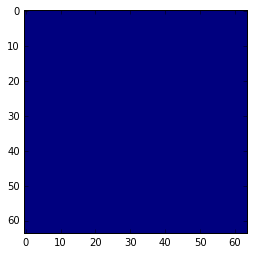

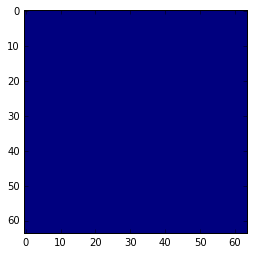

-----------  16
(30, 64, 64)


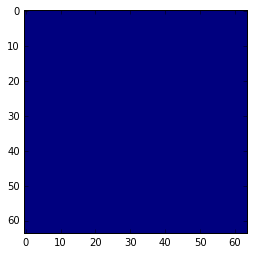

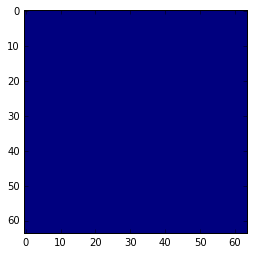

-----------  17
(30, 64, 64)


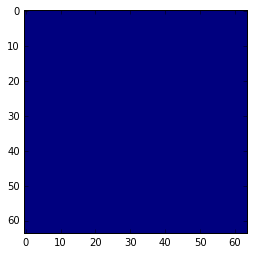

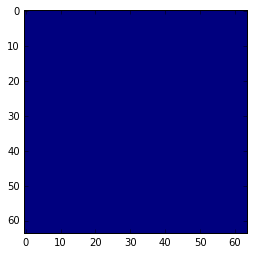

-----------  18
(30, 64, 64)


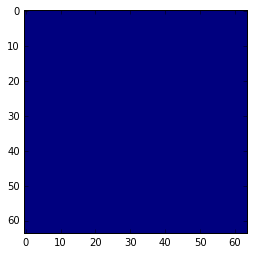

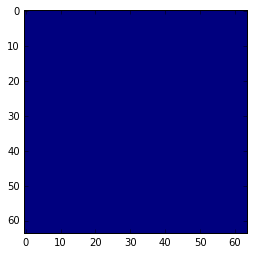

-----------  19
(30, 64, 64)


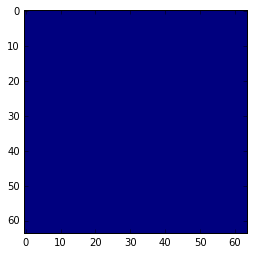

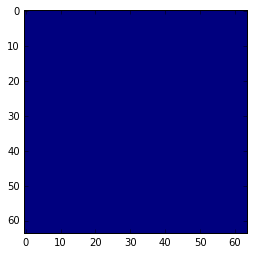

-----------  20
(30, 64, 64)


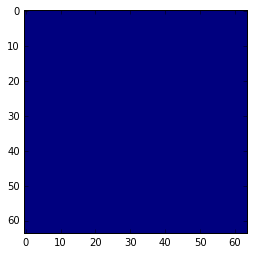

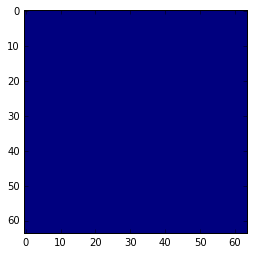

-----------  21
(30, 64, 64)


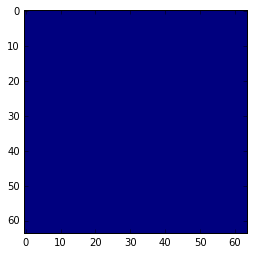

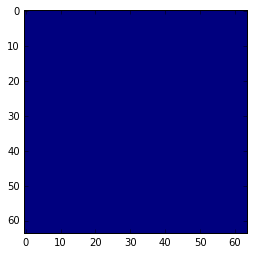

=====
9
=====
-----------  0
(30, 64, 64)


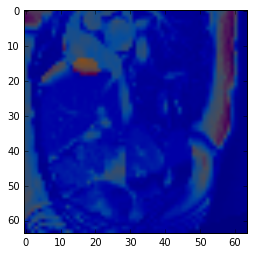

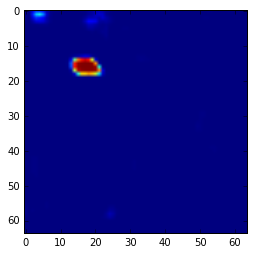

-----------  1
(30, 64, 64)


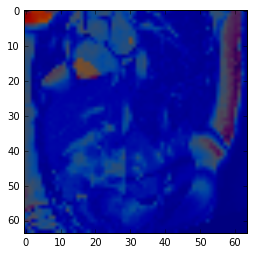

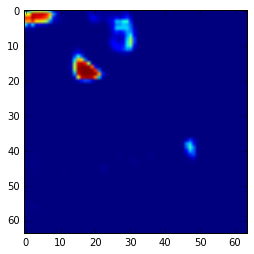

-----------  2
(30, 64, 64)


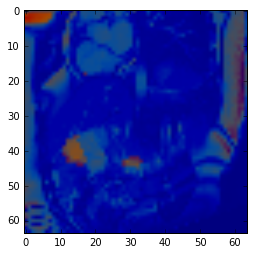

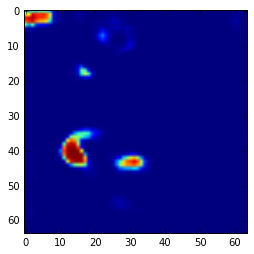

-----------  3
(30, 64, 64)


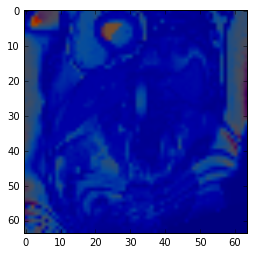

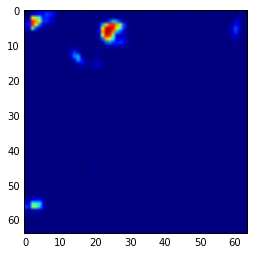

-----------  4
(30, 64, 64)


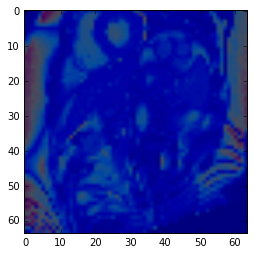

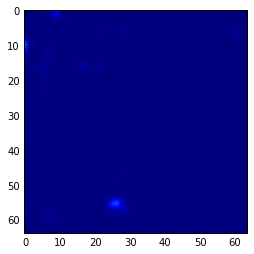

-----------  5
(30, 64, 64)


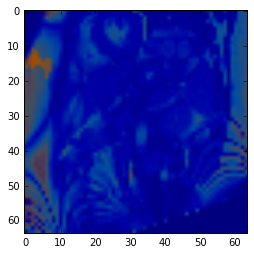

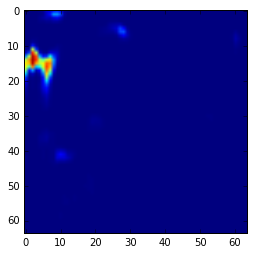

-----------  6
(30, 64, 64)


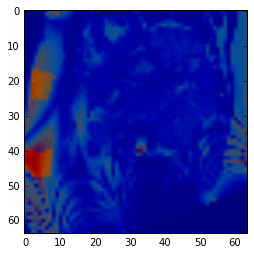

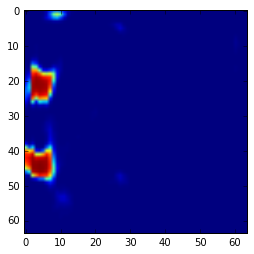

-----------  7
(30, 64, 64)


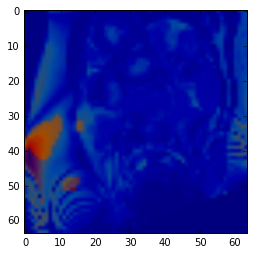

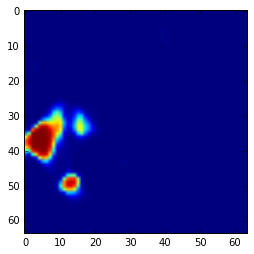

-----------  8
(30, 64, 64)


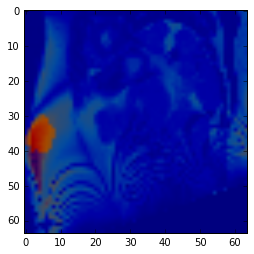

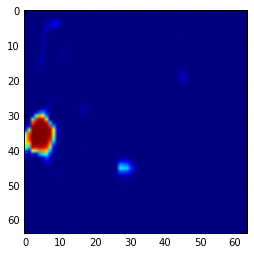

-----------  9
(30, 64, 64)


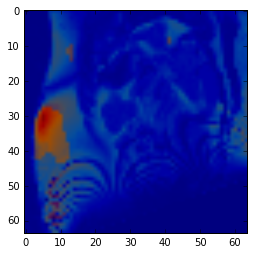

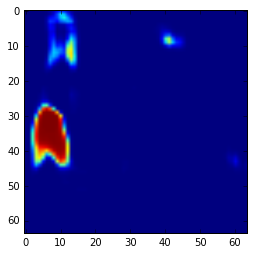

-----------  10
(30, 64, 64)


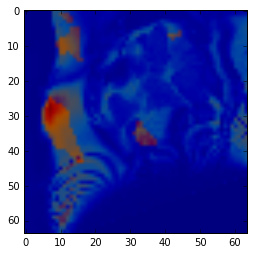

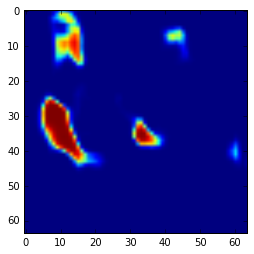

-----------  11
(30, 64, 64)


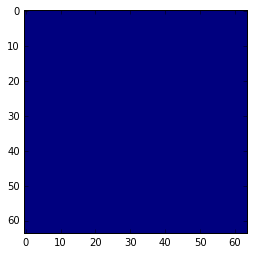

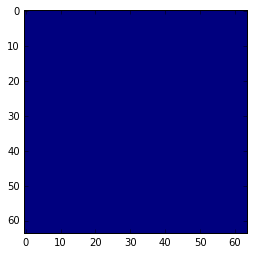

-----------  12
(30, 64, 64)


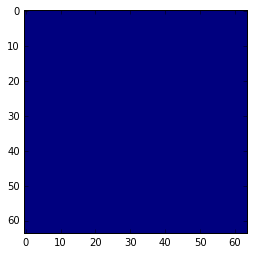

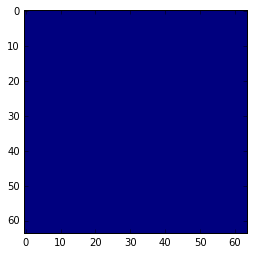

-----------  13
(30, 64, 64)


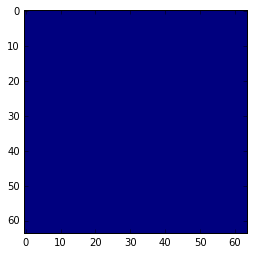

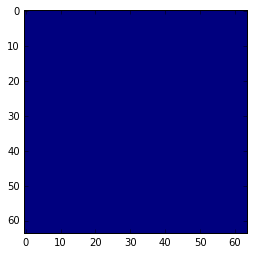

-----------  14
(30, 64, 64)


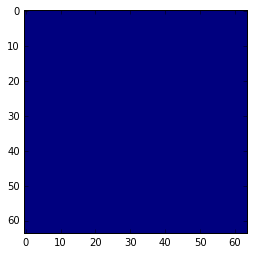

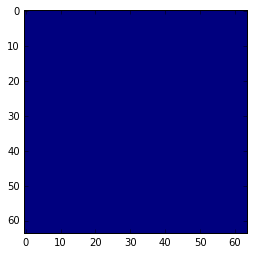

-----------  15
(30, 64, 64)


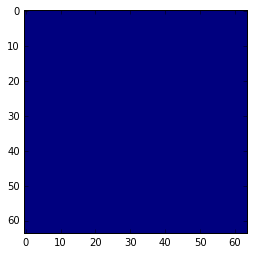

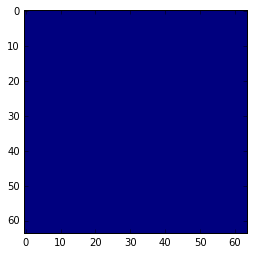

-----------  16
(30, 64, 64)


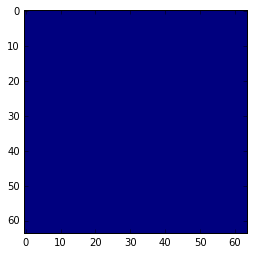

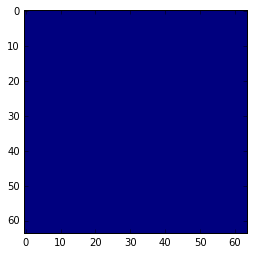

-----------  17
(30, 64, 64)


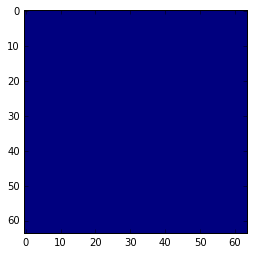

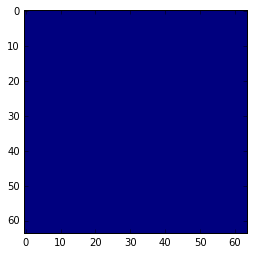

-----------  18
(30, 64, 64)


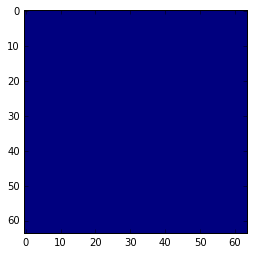

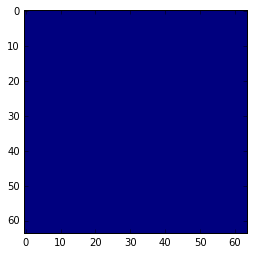

-----------  19
(30, 64, 64)


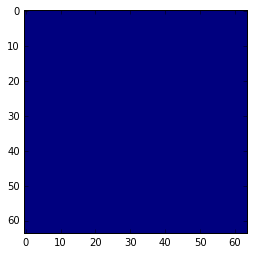

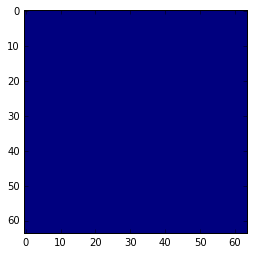

-----------  20
(30, 64, 64)


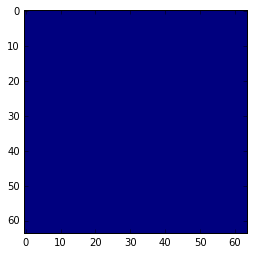

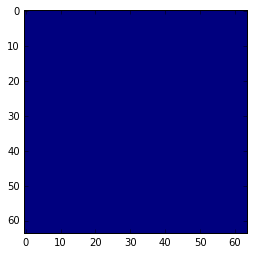

-----------  21
(30, 64, 64)


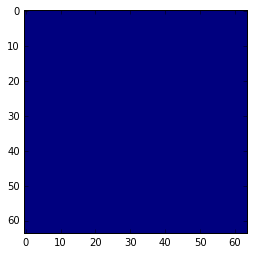

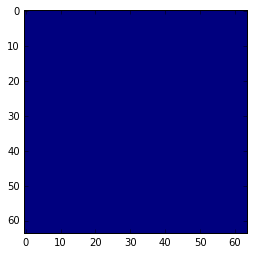

In [15]:
sax_n = 3
i = 0
frame = 10

for i in range(10):
    
    print '=====\n%d\n=====' % i
    for sax_n in range(22):

        print '----------- ', sax_n
        out = f(d[4][:,sax_n,:,:,:])

        print d[4][i,frame,:,:].shape
        plt.imshow(d[4][i,sax_n,frame,:,:])
        plt.imshow(out[i,0,frame,:,:]>0.5, alpha=0.7)
        plt.show()

        plt.imshow(out[i,0,frame,:,:], vmin=0, vmax=1)
        #plt.imshow(d[2][i,frame,:,:], alpha=0.7)
        plt.show()

In [16]:
params_test.keys()

['arr_0']

In [17]:
model = load('train')

/home/ubuntu/mnt/Theano/theano/sandbox/cuda/__init__.py:257: UserWarning: Theano GPUDnnPoolGrad internal changed.
  compute_map, no_recycling)


Using saved session configuration for http://localhost:5006
To override, pass 'load_from_config=False' to Session


/home/ubuntu/mnt/envs/fourth/lib/python2.7/site-packages/bokeh/session.py:318: UserWarning: You need to start the bokeh-server to see this example.
  warnings.warn("You need to start the bokeh-server to see this example.")


ConnectionError: HTTPConnectionPool(host='localhost', port=5006): Max retries exceeded with url: /bokeh/userinfo/ (Caused by NewConnectionError('<requests.packages.urllib3.connection.HTTPConnection object at 0x7f5f508961d0>: Failed to establish a new connection: [Errno 111] Connection refused',))

In [ ]:
model.model